# Loading Modules

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
from LogGabor import LogGabor
from what_where.main import init, MNIST
from what_where.where import RetinaFill, WhereShift, RetinaBackground, RetinaMask
from POLO.PYramid2 import cropped_pyramid, local_filter, get_K, log_gabor_transform
from POLO.PYramid2 import inverse_pyramid, get_K_inv, inverse_gabor
from utils import view_data
from typing import List, Tuple

Default lg shape= 32 32


In [2]:
#args.offset_std = 30
#args.contrast = 0.7

width = {'in': 32, 'out': 64}

n_levels = {'in': 3, 'out': 3} 

base_levels = 2

n_color = {'in': 3, 'out': 3}

color = True

color_mode= 'rgb' #'lab' # 'hsv' #True

r_min = {'in': width['in'] / 4, 'out': width['out'] / 4}

r_max = {'in': width['in'] / 2, 'out': width['out'] / 2}

n_sublevel = n_eccentricity = {'in': 2, 'out': 4}

n_azimuth = {'in': 16, 'out': 32}

n_theta = {'in': 8, 'out': 8}

n_phase = {'in': 1, 'out': 1}

do_mask = False

gauss = False






In [3]:
lg={}
for k in ['in', 'out']:
    pe = {'N_X': width[k], 'N_Y': width[k], 'do_mask': do_mask, 'base_levels':
              base_levels, 'n_theta': 0, 'B_sf': np.inf, 'B_theta': np.inf ,
          'use_cache': True, 'figpath': 'results', 'edgefigpath':
              'results/edges', 'matpath': 'cache_dir', 'edgematpath':
              'cache_dir/edges', 'datapath': 'database/', 'ext': '.pdf', 'figsize':
              14.0, 'formats': ['pdf', 'png', 'jpg'], 'dpi': 450, 'verbose': 0}   

    lg[k] = LogGabor(pe)

In [4]:
K = {}
for k in ['in', 'out']:
    K[k] = get_K(width=width[k],
          n_sublevel = n_sublevel[k], 
          n_azimuth = n_azimuth[k], 
          n_theta = n_theta[k],
          n_phase = n_phase[k], 
          r_min = r_min[k], 
          r_max = r_max[k], 
          log_density_ratio = 2, 
          verbose=True,
          lg=lg[k])

i_sublevel, sf_0, radius 0 0.36067376022224085 8.0
i_sublevel, sf_0, radius 1 0.25503486164919736 11.31370849898476
K shape= torch.Size([32, 32, 2, 16, 8, 1])
K min max= tensor(-0.3125) tensor(1.)
i_sublevel, sf_0, radius 0 0.18033688011112042 16.0
i_sublevel, sf_0, radius 1 0.15164463602348005 19.027313840043536
i_sublevel, sf_0, radius 2 0.12751743082459868 22.62741699796952
i_sublevel, sf_0, radius 3 0.10722895046276856 26.908685288118864
K shape= torch.Size([64, 64, 4, 32, 8, 1])
K min max= tensor(-0.2759) tensor(1.)


In [5]:
K_inv={}
for k in ['in', 'out']:
    K_inv[k] = get_K_inv(K[k], 
                  width=width[k], 
                  n_sublevel = n_sublevel[k], 
                  n_azimuth = n_azimuth[k], 
                  n_theta = n_theta[k], 
                  n_phase = n_phase[k])

Filter tensor shape= torch.Size([32, 32, 2, 16, 8, 1])
Reshaped filter tensor= torch.Size([1024, 256])
Tensor shape= torch.Size([256, 1024])
Filter tensor shape= torch.Size([64, 64, 4, 32, 8, 1])
Reshaped filter tensor= torch.Size([4096, 1024])
Tensor shape= torch.Size([1024, 4096])


# Loading the Data

- Loading the data with the parameters given in the .json file for the What/Where model

In [6]:
args = init(filename='2020-07-01')
args

{'w': 28,
 'minibatch_size': 100,
 'train_batch_size': 50000,
 'test_batch_size': 10000,
 'noise_batch_size': 1000,
 'mean': 0.1307,
 'std': 0.3081,
 'what_offset_std': 15,
 'what_offset_max': 25,
 'N_pic': 128,
 'offset_std': 30,
 'offset_max': 34,
 'noise': 0.75,
 'contrast': 0.7,
 'sf_0': 0.1,
 'B_sf': 0.1,
 'do_mask': True,
 'N_theta': 6,
 'N_azimuth': 24,
 'N_eccentricity': 10,
 'N_phase': 2,
 'rho': 1.41,
 'bias_deconv': True,
 'p_dropout': 0.0,
 'dim1': 1000,
 'dim2': 1000,
 'lr': 0.005,
 'do_adam': True,
 'bn1_bn_momentum': 0.5,
 'bn2_bn_momentum': 0.5,
 'momentum': 0.3,
 'epochs': 60,
 'num_processes': 1,
 'no_cuda': False,
 'log_interval': 100,
 'verbose': 1,
 'filename': '../data/2020-07-01',
 'seed': 2019,
 'N_cv': 10,
 'do_compute': True,
 'save_model': True}

In [7]:
class DualCroppedPyramid(object):
    def __init__(self, width, 
                 base_levels, 
                 color=color, 
                 do_mask=do_mask, 
                 verbose=False, 
                 n_levels=None, 
                 color_mode='rgb'):
        self.width = width
        self.base_levels = base_levels
        self.color = color
        self.do_mask = do_mask
        self.verbose = verbose
        self.n_levels = n_levels
        self.color_mode = color_mode

    def __call__(self, img):
        img_crop = {}
        for k in ['in', 'out']:
            img_crop_part, level_size = cropped_pyramid(img.unsqueeze(0), 
                                               width=self.width[k], 
                                               base_levels=self.base_levels,
                                               color=self.color, 
                                               do_mask=self.do_mask, 
                                               verbose=self.verbose,
                                               squeeze=True,
                                               gauss=gauss,
                                               n_levels=self.n_levels[k],
                                               color_mode=self.color_mode)
            #print(img_crop_part.shape)
            img_crop[k] = img_crop_part[:self.n_levels[k]-1,...]
        return img, img_crop   

### LogGaborTransform

In [8]:
class DualLogGaborTransform(object):
    def __init__(self, K=K, color=color, verbose=False):
        self.K = K
        self.color = color
        self.verbose = verbose

    def __call__(self, cropped_pyr):
        img = cropped_pyr[0]
        img_crop = cropped_pyr[1]
        log_gabor_coeffs = {}
        for k in ['in', 'out']:
            log_gabor_coeffs[k] = log_gabor_transform(img_crop[k].unsqueeze(1), K[k], color=self.color).squeeze(1)
        
        return img, log_gabor_coeffs

In [9]:
class DualLogGaborReshape(object):
    def __init__(self, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color, verbose=False):
        self.n_levels = n_levels
        self.n_color = n_color
        self.n_eccentricity = n_eccentricity 
        self.n_azimuth = n_azimuth 
        self.n_theta = n_theta
        self.n_phase = n_phase  
        self.color = color
        self.verbose = verbose

    def __call__(self, log_gabor_transform):
        img = log_gabor_transform[0]
        log_gabor_coeffs = log_gabor_transform[1]
        for k in ['in', 'out']:
            # n_batch, n_levels, n_color, n_sublevel, n_azimuth, n_theta, n_phase
            # x      , 0       , 1      , 2         , 3        , 4      , 5
            # 
            #print(log_gabor_coeffs[k].shape)
            log_gabor_coeffs[k] = log_gabor_coeffs[k].permute(1, 4, 5, 0, 2, 3).contiguous()
            log_gabor_coeffs[k] = log_gabor_coeffs[k].view(self.n_color[k]*self.n_theta[k]*self.n_phase[k], 
                                                     (self.n_levels[k]-1) * self.n_eccentricity[k], 
                                                     self.n_azimuth[k])
 
        return img, log_gabor_coeffs

In [10]:
class LogGaborInvReshape(object):
    def __init__(self, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color, verbose=False):
        self.n_levels = n_levels
        self.n_color = n_color
        self.n_eccentricity = n_eccentricity 
        self.n_azimuth = n_azimuth 
        self.n_theta = n_theta
        self.n_phase = n_phase  
        self.color = color
        self.verbose = verbose
    
    def __call__(self, log_gabor_coeffs):

        if self.verbose:
            print('log_gabor_coeffs.shape:', log_gabor_coeffs.shape)
        log_gabor_coeffs = log_gabor_coeffs.view(-1, 
                                                 self.n_color, 
                                                 self.n_theta, 
                                                 self.n_phase, 
                                                 self.n_levels-1, 
                                                 self.n_eccentricity, 
                                                 self.n_azimuth)
        log_gabor_coeffs = log_gabor_coeffs.permute(0, 4, 1, 5, 6, 2, 3).contiguous()
        return log_gabor_coeffs

In [11]:
class LogGaborInvTransform(object):
    def __init__(self, K_inv=K_inv, color=color, verbose=False):
        self.K_inv = K_inv
        self.color = color
        self.verbose = verbose
    
    def __call__(self, log_gabor_coeffs):
        log_gabor_coeffs = torch.cat((log_gabor_coeffs,torch.zeros_like(log_gabor_coeffs[:,:1,...])), dim=1) 
        img_crop=inverse_gabor(log_gabor_coeffs.detach(), self.K_inv, self.verbose)
        if self.verbose:
            print('img_crop.shape:', img_crop.shape)

        return img_crop

In [12]:
class InvCroppedPyramid(object):
    def __init__(self, 
                 #width, 
                 base_levels, 
                 color=color, 
                 #do_mask=do_mask, 
                 verbose=False, 
                 n_levels=None, 
                 color_mode='rgb',
                 N_X = 128,
                 N_Y = 128):
        #self.width = width
        self.base_levels = base_levels
        self.color = color
        #self.do_mask = do_mask
        self.verbose = verbose
        self.n_levels = n_levels
        self.color_mode = color_mode
        self.N_X = N_X
        self.N_Y = N_Y

    def __call__(self, img_crop):
        #print('img_crop.shape:', img_crop.shape)
        full_img_rec = inverse_pyramid(img_crop, 
                                       N_X = self.N_X,
                                       N_Y = self.N_Y,
                                       #width=self.width, 
                                       base_levels=self.base_levels,
                                       color=self.color, 
                                       #do_mask=self.do_mask, 
                                       verbose=self.verbose,
                                       #squeeze=True,
                                       gauss=gauss,
                                       n_levels=self.n_levels) #,
                                       #color_mode=self.color_mode)
        return full_img_rec

### Inverse transformations (for display only)

# Exploring the MNIST with where noise parameters and log polar encoding

- 128x128 pixel with shift, noise and circular mask

In [13]:
#args.offset_max = 40 #like in the paper

In [14]:
# normalization used to train VGG
# see https://pytorch.org/hub/pytorch_vision_vgg/
v_mean = np.array([0.485, 0.456, 0.406])
v_std = np.array([0.229, 0.224, 0.225])
transforms_norm = transforms.Normalize(mean=v_mean, std=v_std) # to normalize colors on the imagenet dataset



In [15]:
image_size = 256

transform_big =  transforms.Compose([
            transforms.Resize((int(image_size), int(image_size))),
            #transforms.AutoAugment(), # https://pytorch.org/vision/master/transforms.html#torchvision.transforms.AutoAugment
            transforms.ToTensor(),      # Convert the image to pyTorch Tensor data type.
            #transforms_norm, 
            DualCroppedPyramid(width=width, 
                  base_levels=base_levels,
                  color=color,
                  n_levels=n_levels),
            DualLogGaborTransform(K=K, color=color),
            DualLogGaborReshape(n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color),
        ])

In [16]:
width,base_levels, color, n_levels

({'in': 32, 'out': 64}, 2, True, {'in': 3, 'out': 3})

In [17]:
image_path = "../data/animal/"

image_dataset = { 'train' : datasets.ImageFolder(
                            image_path+'train', 
                            transform=transform_big
                        ),
                  'test' : datasets.ImageFolder(
                            image_path+'test', 
                            transform=transform_big
                        )
                }

In [18]:
dataset_size = {'train' : len(image_dataset['train']),
                'test' : len(image_dataset['test'])}

dataset_size['train'], dataset_size['test']

(2000, 1200)

In [19]:
batch_size = 50
num_workers = 1

dataloader = { 'train' : torch.utils.data.DataLoader(
                            image_dataset['train'], batch_size=batch_size,
                            shuffle=True, 
                            num_workers=num_workers,
                        ),
               'test' : torch.utils.data.DataLoader(
                            image_dataset['test'], batch_size=batch_size,
                            shuffle=True, 
                            num_workers=num_workers,
                        )
             }

In [20]:
data, label = next(iter(dataloader['train']))

In [21]:
data_original = data[0]
data_polo = data[1]
data_original.shape, data_polo['in'].shape, data_polo['out'].shape

(torch.Size([50, 3, 256, 256]),
 torch.Size([50, 24, 4, 16]),
 torch.Size([50, 24, 8, 32]))

In [22]:
# n_batch, n_levels, n_color, n_sublevel, n_azimuth, n_theta, n_phase

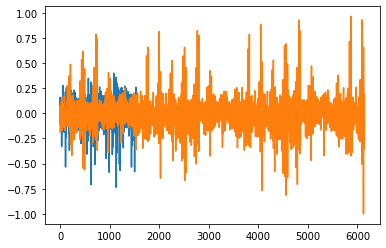

In [23]:
plt.plot(data_polo['in'][3,...].detach().numpy().flatten())
plt.plot(data_polo['out'][3,...].detach().numpy().flatten())


### Displaying Log Gabor Encoded visual field using pseudo-inverse transformation

In [24]:
inverse_transform = {}
for k in ['in', 'out']:
    N_X = N_Y = width[k] * 2**(n_levels[k]-1)
    print(N_X)
    inverse_transform[k] = transforms.Compose([
        LogGaborInvReshape(n_levels[k], n_color[k], n_eccentricity[k], n_azimuth[k], n_theta[k], n_phase[k], color=color, verbose=False),        
        LogGaborInvTransform(K_inv=K_inv[k], color=color, verbose=False),
        InvCroppedPyramid(base_levels, n_levels=n_levels[k], verbose=False, N_X=N_X, N_Y=N_Y),
    ])

128
256


- The Log-Polar compressed format

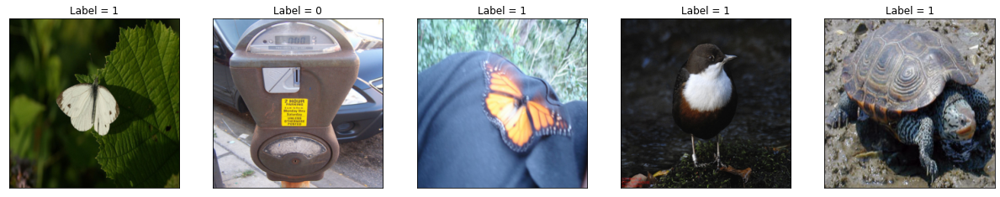

In [25]:
original = view_data(data_original, label, 5)

In [26]:
inverse_transform['in']

Compose(
)

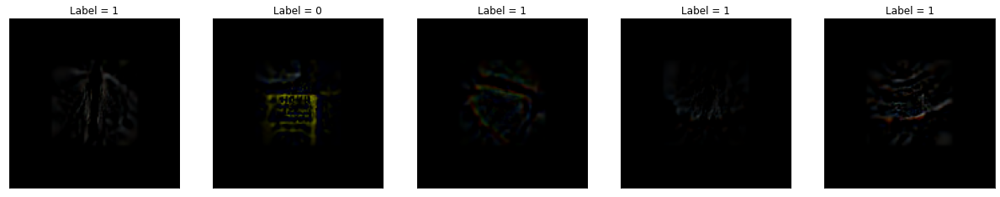

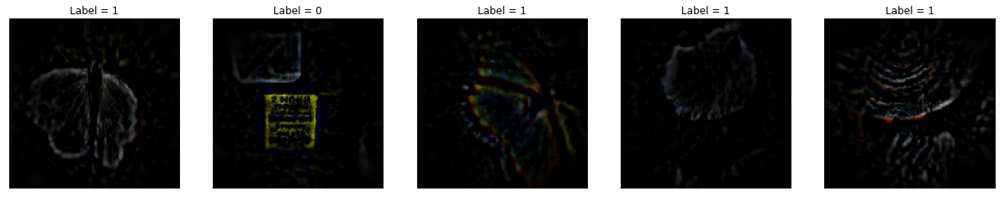

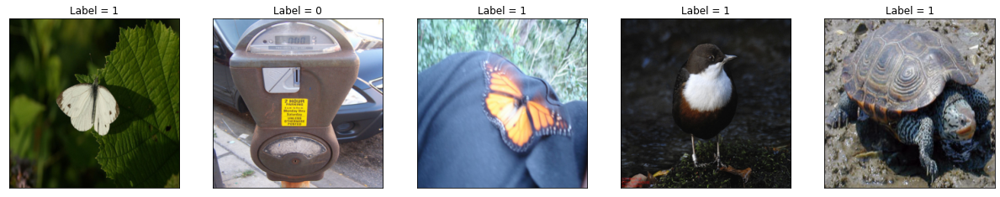

In [27]:
b = {'in':32,'out':64}
for k in ['in', 'out']:
    data = data_polo[k] #torch.cat((data_polo[k],torch.zeros_like(data_polo[k][:,:1,...])), dim=1) 
    full_img_rec = inverse_transform[k](data)
    img_aff = full_img_rec[:,:,b[k]:-b[k],b[k]:-b[k]]    
    if k == 'in':
        img_sum = full_img_rec
    else:
        img_sum += img_aff
    _ = view_data(img_sum*2, label, 5)
_ = view_data(data_original, label, 5)

In [28]:
76800 / (3 * 8 * 2 * 2 * 16)

50.0

- The original format

In [29]:
data_polo['in'].shape, data_polo['out'].shape

(torch.Size([50, 24, 4, 16]), torch.Size([50, 24, 8, 32]))

# Creating an Attention Transformer model with log-polar entry (POLO-STN)

In [30]:
transform_in =  transforms.Compose([
            DualCroppedPyramid(width=width, 
                  base_levels=base_levels,
                  color=color,
                  n_levels=n_levels),
            DualLogGaborTransform(K=K, color=color),
            DualLogGaborReshape(n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color),
        ])

In [39]:
def kl_divergence(model, z):
    # --------------------------
    # Monte carlo KL divergence
    # --------------------------
    # 1. define the first two probabilities (in this case Normal for both)
    p = torch.distributions.Normal(torch.zeros_like(z), .3 * torch.ones_like(z))

    # 2. get the probabilities from the equation
    log_qzx = model.q.log_prob(z)
    log_pz = p.log_prob(z)

    # kl
    kl = (log_qzx - log_pz)
    
    # sum over last dim to go from single dim distribution to multi-dim
    kl = model.LAMBDA * kl.sum()
    return kl

In [40]:
class Polo_AttentionTransNet(nn.Module):
    
    def __init__(self, LAMBDA=1e-3):
        super(Polo_AttentionTransNet, self).__init__()
        
        self.LAMBDA=LAMBDA

        ##  The what pathway
        self.conv1 = nn.Conv2d(3, 20, 5)
        self.conv2 = nn.Conv2d(20, 50, 5)
        self.fc1 = nn.Linear(4 * 4 * 50, 500)
        self.fc2 = nn.Linear(500, 2)

        #self.wloc4.weight.data.zero_()
        #self.wloc4.bias.data.zero_()

                
        ##  The where pathway        
        self.loc1 = nn.Conv2d(n_color['out'] * n_theta['out'] * n_phase['out'], 
                              50, 5, padding=2)
        self.loc2a = nn.Conv2d(50, 100, 5, padding=2)
        self.loc2b = nn.Conv2d(n_color['in'] * n_theta['in'] * n_phase['in'], 
                               50, 5, padding=2)
        self.loc3 = nn.Linear((n_levels['in']-1) * n_eccentricity['in'] // 2 * n_azimuth['in'] // 2 * (50+100), 
                              500)
        self.mu = nn.Linear(500, 2) #, bias=False)
        self.logvar = nn.Linear(500, 2) #, bias=False)
        
        

        #self.loc4.weight.data.zero_()
        #self.loc4.bias.data.zero_()

        self.downscale = nn.Parameter(torch.tensor([[.2, 0], [0, .2]],
                                                   dtype=torch.float),
                                      requires_grad=False)

    def stn(self: object, x: torch.Tensor, x_polo: torch.Tensor) -> Tuple[torch.Tensor]:
    
        
        xs = F.relu(self.loc1(x_polo['out']))
        xs = nn.MaxPool2d(2)(xs)        

        #print(xs.shape)

        xsa = F.relu(self.loc2a(xs))
        xsa = nn.MaxPool2d(2)(xsa)

        #print(xsa.shape)

        xsb = F.relu(self.loc2b(x_polo['in']))
        xsb = nn.MaxPool2d(2)(xsb)

        #print(xsb.shape)

        xs = torch.cat((xsa, xsb), dim=1)
        xs = F.relu(self.loc3(xs.view(-1, 
                                      (50+100) * (n_levels['in']-1) * n_eccentricity['in'] // 2 * n_azimuth['in'] // 2)))
        #theta = F.sigmoid(self.loc4(xs)) - 0.5
        #theta = self.loc4(xs)
        mu = self.mu(xs)
        logvar = self.logvar(xs) + 3
        sigma = torch.exp(-logvar / 2)
        self.q = torch.distributions.Normal(mu, sigma)
        z = self.q.rsample()
        print(z[0,...])
        theta = torch.cat((self.downscale.unsqueeze(0).repeat(
                            z.size(0), 1, 1), z.unsqueeze(2)),
                              dim=2)

        grid_size = torch.Size([x.size()[0], x.size()[1], 28, 28])
        grid = F.affine_grid(theta, grid_size)
        x = F.grid_sample(x, grid)

       
        return x, theta, z

    def forward(self, x, x_polo):
        # transform the input
        x, theta, z = self.stn(x, x_polo)                                   

        # print(x.shape)
        # Perform the usual forward pass
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2, 2)

        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2, 2)

        x = x.view(-1, 4 * 4 * 50)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x, theta, z

In [41]:
def train(epoch, loader):
    model.train()
    for batch_idx, (data, target) in enumerate(loader):

        data_original, data_polo = data[0], data[1]
        data_original, data_polo['in'], data_polo['out'], target = data_original.to(
            device, dtype=torch.double), data_polo['in'].to(
                device, dtype=torch.double), data_polo['out'].to(
                device, dtype=torch.double), target.to(device)

        optimizer.zero_grad()
        output, theta, z = model(data_original, data_polo)
        
        loss = loss_func(output, target) + kl_divergence(model, z)
        loss.backward()
        optimizer.step()
        if batch_idx % args.log_interval == 0:
            print('Train Epoch: {}/{} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, args.epochs, batch_idx * len(data_original),
                len(dataloader['train'].dataset),
                100. * batch_idx / len(dataloader['train']), loss.item()))


def test(loader):
    with torch.no_grad():
        model.eval()
        test_loss = 0
        correct = 0
        for data, target in loader:
            data_original, data_polo = data[0], data[1]
            data_original = data_original.to(device, dtype=torch.double)            
            data_polo['in'] = data_polo['in'].to(device, dtype=torch.double) 
            data_polo['out'] = data_polo['out'].to(device, dtype=torch.double) 
            target = target.to(device)

            output, theta, z = model(data_original, data_polo)

            # sum up batch loss
            #test_loss += F.nll_loss(output, target, size_average=False).item()
            test_loss += loss_func(output, target).item() + kl_divergence(model, z).item()
            # get the index of the max log-probability
            #pred = output.max(1, keepdim=True)[1]
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()

        test_loss /= len(dataloader['test'].dataset)
        print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.
              format(test_loss, correct, len(dataloader['test'].dataset),
                     100. * correct / len(dataloader['test'].dataset)))
        return correct / len(dataloader['test'].dataset)

# Training 

In [42]:
lr = 1e-4
LAMBDA = 1e-3

In [43]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#model = torch.load("../models/low_comp_polo_stn.pt")
model = Polo_AttentionTransNet(LAMBDA=LAMBDA).to(device)

In [44]:
optimizer = optim.Adam(model.parameters(), lr=lr)
#optimizer = optim.SGD(model.parameters(), lr=lr)
loss_func = nn.CrossEntropyLoss()
#scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.9, last_epoch=-1) #, verbose=True)

In [45]:
acc = []

In [46]:
args.epochs = 100
for epoch in range(1, args.epochs + 1):
    train(epoch, dataloader['train'])
    curr_acc = test(dataloader['test'])
    acc.append(curr_acc)
    #scheduler.step()

tensor([0.1496, 0.0491], grad_fn=<SelectBackward0>)
Train Epoch: 1/100 [0/2000 (0%)]	Loss: 0.711877
tensor([ 0.0582, -0.2080], grad_fn=<SelectBackward0>)
tensor([-0.1777, -0.3481], grad_fn=<SelectBackward0>)
tensor([ 0.2055, -0.0416], grad_fn=<SelectBackward0>)
tensor([ 0.2593, -0.4575], grad_fn=<SelectBackward0>)
tensor([0.1631, 0.0520], grad_fn=<SelectBackward0>)
tensor([0.0151, 0.3023], grad_fn=<SelectBackward0>)
tensor([0.0161, 0.0297], grad_fn=<SelectBackward0>)
tensor([0.0190, 0.0355], grad_fn=<SelectBackward0>)
tensor([ 0.1394, -0.0518], grad_fn=<SelectBackward0>)
tensor([0.1717, 0.2306], grad_fn=<SelectBackward0>)
tensor([-0.5929,  0.1090], grad_fn=<SelectBackward0>)
tensor([-0.0097, -0.0719], grad_fn=<SelectBackward0>)
tensor([-0.1835,  0.0879], grad_fn=<SelectBackward0>)
tensor([ 0.0542, -0.3439], grad_fn=<SelectBackward0>)
tensor([-0.2579, -0.0688], grad_fn=<SelectBackward0>)
tensor([-0.1320,  0.0779], grad_fn=<SelectBackward0>)
tensor([0.3463, 0.0119], grad_fn=<SelectBackwa

tensor([-0.5427,  0.0713])
tensor([ 0.2635, -0.0756])
tensor([-0.4715,  0.5704])
tensor([-0.1946,  0.1980])
tensor([0.3023, 0.1236])
tensor([-0.0631, -0.0505])
tensor([-0.2722, -0.0288])
tensor([-0.2522,  0.2087])
tensor([-0.0559, -0.2355])
tensor([ 0.3219, -0.1991])
tensor([-0.2205,  0.6129])
tensor([-0.0692,  0.0395])
tensor([-0.1772, -0.0272])
tensor([-0.5274,  0.1169])
tensor([-0.0019, -0.3696])

Test set: Average loss: 0.0137, Accuracy: 691/1200 (58%)

tensor([0.0620, 0.4899], grad_fn=<SelectBackward0>)
Train Epoch: 4/100 [0/2000 (0%)]	Loss: 0.703910
tensor([0.2340, 0.0944], grad_fn=<SelectBackward0>)
tensor([-0.3442, -0.2581], grad_fn=<SelectBackward0>)
tensor([-0.0685, -0.0796], grad_fn=<SelectBackward0>)
tensor([ 0.2881, -0.4540], grad_fn=<SelectBackward0>)
tensor([-0.3648,  0.0936], grad_fn=<SelectBackward0>)
tensor([-0.4018, -0.0960], grad_fn=<SelectBackward0>)
tensor([-0.1876,  0.2355], grad_fn=<SelectBackward0>)
tensor([-0.2517,  0.3724], grad_fn=<SelectBackward0>)
tensor([

tensor([-0.2732,  0.3499], grad_fn=<SelectBackward0>)
tensor([-0.1710,  0.0417], grad_fn=<SelectBackward0>)
tensor([ 0.1283, -0.1862], grad_fn=<SelectBackward0>)
tensor([ 0.2512, -0.0901])
tensor([0.0382, 0.2239])
tensor([-0.0197, -0.1262])
tensor([-0.0904, -0.0716])
tensor([-0.1498,  0.2897])
tensor([-0.2569, -0.2276])
tensor([-0.2450, -0.2007])
tensor([ 0.2242, -0.3471])
tensor([ 0.0495, -0.2909])
tensor([-0.0194,  0.1565])
tensor([0.2785, 0.2701])
tensor([0.1884, 0.2979])
tensor([-0.0329, -0.1891])
tensor([-0.2769, -0.3963])
tensor([-0.3155,  0.5220])
tensor([ 0.2366, -0.0955])
tensor([-0.5012,  0.1142])
tensor([-0.1347,  0.0467])
tensor([ 0.0542, -0.4394])
tensor([-0.3053, -0.5187])
tensor([-0.4371, -0.3579])
tensor([-0.5307,  0.2356])
tensor([ 0.4093, -0.2654])
tensor([0.4389, 0.1326])

Test set: Average loss: 0.0135, Accuracy: 685/1200 (57%)

tensor([-0.0733,  0.1944], grad_fn=<SelectBackward0>)
Train Epoch: 7/100 [0/2000 (0%)]	Loss: 0.668450
tensor([-0.1057, -0.0298], grad_fn=<S

tensor([0.1020, 0.0330], grad_fn=<SelectBackward0>)
tensor([-0.2222, -0.1220], grad_fn=<SelectBackward0>)
tensor([-0.2551, -0.4451], grad_fn=<SelectBackward0>)
tensor([-0.6842, -0.1710], grad_fn=<SelectBackward0>)
tensor([-0.3379,  0.3400], grad_fn=<SelectBackward0>)
tensor([-0.3502, -0.0959], grad_fn=<SelectBackward0>)
tensor([-0.0638,  0.0518], grad_fn=<SelectBackward0>)
tensor([ 0.0471, -0.3714], grad_fn=<SelectBackward0>)
tensor([0.0778, 0.1551], grad_fn=<SelectBackward0>)
tensor([-0.2218, -0.0123], grad_fn=<SelectBackward0>)
tensor([-0.1834,  0.0411], grad_fn=<SelectBackward0>)
tensor([0.0612, 0.3440])
tensor([ 0.1443, -0.0593])
tensor([ 0.0930, -0.0360])
tensor([ 0.3599, -0.0337])
tensor([-0.0674,  0.1274])
tensor([-0.0453, -0.1878])
tensor([-0.0544,  0.0719])
tensor([-0.5755,  0.1202])
tensor([0.1016, 0.4453])
tensor([0.3805, 0.2461])
tensor([ 0.0074, -0.0107])
tensor([ 0.0620, -0.4782])
tensor([0.4248, 0.0021])
tensor([ 0.2536, -0.2352])
tensor([-0.3218, -0.4289])
tensor([ 0.18

tensor([0.0185, 0.5712], grad_fn=<SelectBackward0>)
tensor([-0.0432, -0.2931], grad_fn=<SelectBackward0>)
tensor([-0.1792,  0.2649], grad_fn=<SelectBackward0>)
tensor([-0.6730,  0.3275], grad_fn=<SelectBackward0>)
tensor([-0.3153, -0.0815], grad_fn=<SelectBackward0>)
tensor([-0.1948,  0.0249], grad_fn=<SelectBackward0>)
tensor([-0.0545, -0.1346], grad_fn=<SelectBackward0>)
tensor([-0.0384, -0.1053], grad_fn=<SelectBackward0>)
tensor([-0.2415,  0.4270], grad_fn=<SelectBackward0>)
tensor([0.3253, 0.0797], grad_fn=<SelectBackward0>)
tensor([ 0.0544, -0.2489], grad_fn=<SelectBackward0>)
tensor([0.1255, 0.3147], grad_fn=<SelectBackward0>)
tensor([-0.1669,  0.1258], grad_fn=<SelectBackward0>)
tensor([ 0.1885, -0.0199], grad_fn=<SelectBackward0>)
tensor([-0.1864,  0.2484], grad_fn=<SelectBackward0>)
tensor([ 0.0623, -0.1239], grad_fn=<SelectBackward0>)
tensor([ 0.0010, -0.0091], grad_fn=<SelectBackward0>)
tensor([ 0.4393, -0.0371], grad_fn=<SelectBackward0>)
tensor([ 0.1603, -0.4701], grad_fn

tensor([-0.2038,  0.0908], grad_fn=<SelectBackward0>)
tensor([-0.3115, -0.2764], grad_fn=<SelectBackward0>)
tensor([0.1301, 0.8329], grad_fn=<SelectBackward0>)
tensor([0.1033, 0.0777], grad_fn=<SelectBackward0>)
tensor([0.4915, 0.6129], grad_fn=<SelectBackward0>)
tensor([ 0.4877, -0.1625], grad_fn=<SelectBackward0>)
tensor([ 0.4595, -0.0481], grad_fn=<SelectBackward0>)
tensor([ 0.1659, -0.1714], grad_fn=<SelectBackward0>)
tensor([-0.2341,  0.4989], grad_fn=<SelectBackward0>)
tensor([0.1349, 0.3549], grad_fn=<SelectBackward0>)
tensor([2.8198e-04, 4.7217e-01], grad_fn=<SelectBackward0>)
tensor([0.4105, 0.1563], grad_fn=<SelectBackward0>)
tensor([0.1516, 0.1142], grad_fn=<SelectBackward0>)
tensor([0.1553, 0.1253], grad_fn=<SelectBackward0>)
tensor([0.2761, 0.5327], grad_fn=<SelectBackward0>)
tensor([-0.3288,  0.0813], grad_fn=<SelectBackward0>)
tensor([0.3043, 0.3248], grad_fn=<SelectBackward0>)
tensor([0.5079, 0.2728], grad_fn=<SelectBackward0>)
tensor([-0.0064,  0.1065], grad_fn=<Select

tensor([-0.4767,  0.2496], grad_fn=<SelectBackward0>)
tensor([-0.7313, -0.0695], grad_fn=<SelectBackward0>)
tensor([0.1562, 0.1269], grad_fn=<SelectBackward0>)
tensor([-0.4864,  0.3436], grad_fn=<SelectBackward0>)
tensor([ 0.5006, -0.1456], grad_fn=<SelectBackward0>)
tensor([-0.2679,  0.1340], grad_fn=<SelectBackward0>)
tensor([-0.2910,  0.1094], grad_fn=<SelectBackward0>)
tensor([-0.2629, -0.0492], grad_fn=<SelectBackward0>)
tensor([-0.2539,  0.1227], grad_fn=<SelectBackward0>)
tensor([0.4370, 0.1129], grad_fn=<SelectBackward0>)
tensor([-1.0345,  0.6704], grad_fn=<SelectBackward0>)
tensor([-0.5199,  0.0687], grad_fn=<SelectBackward0>)
tensor([-0.3251,  0.3603], grad_fn=<SelectBackward0>)
tensor([-0.2228,  0.4870], grad_fn=<SelectBackward0>)
tensor([-0.7425,  0.0572], grad_fn=<SelectBackward0>)
tensor([ 0.0136, -0.0159], grad_fn=<SelectBackward0>)
tensor([ 0.2820, -0.0153], grad_fn=<SelectBackward0>)
tensor([0.4302, 0.4323], grad_fn=<SelectBackward0>)
tensor([-0.0587,  0.1828], grad_fn

tensor([-0.1620, -0.0392])
tensor([ 0.4619, -0.3105])
tensor([ 0.1331, -0.1448])
tensor([ 0.3297, -0.0101])
tensor([-0.0753,  0.1310])

Test set: Average loss: 0.0130, Accuracy: 746/1200 (62%)

tensor([-0.1948, -0.0721], grad_fn=<SelectBackward0>)
Train Epoch: 21/100 [0/2000 (0%)]	Loss: 0.648228
tensor([ 0.1566, -0.4019], grad_fn=<SelectBackward0>)
tensor([ 0.1986, -0.4191], grad_fn=<SelectBackward0>)
tensor([ 0.5129, -0.4160], grad_fn=<SelectBackward0>)
tensor([ 0.4971, -0.6851], grad_fn=<SelectBackward0>)
tensor([-0.0907, -0.0617], grad_fn=<SelectBackward0>)
tensor([ 0.1225, -0.0786], grad_fn=<SelectBackward0>)
tensor([-0.5555, -0.1063], grad_fn=<SelectBackward0>)
tensor([-0.0853,  0.0868], grad_fn=<SelectBackward0>)
tensor([-0.0014,  0.4121], grad_fn=<SelectBackward0>)
tensor([-0.3617, -0.2827], grad_fn=<SelectBackward0>)
tensor([ 0.0462, -0.1448], grad_fn=<SelectBackward0>)
tensor([ 0.1761, -0.3235], grad_fn=<SelectBackward0>)
tensor([0.0156, 0.0273], grad_fn=<SelectBackward0>)
ten

tensor([-0.0581, -0.3467])
tensor([-0.3146, -0.4898])
tensor([-0.4425, -0.6270])
tensor([-0.3348,  0.1588])
tensor([-0.1550,  0.2334])
tensor([-0.1084,  0.1181])
tensor([-0.1543,  0.6390])
tensor([ 0.3431, -0.1324])
tensor([0.3983, 0.1000])
tensor([-0.0475, -0.0550])
tensor([-0.1282, -0.0004])
tensor([0.0228, 0.2855])
tensor([-0.2768, -0.2847])
tensor([-0.2003, -0.2710])
tensor([ 0.1954, -0.1007])
tensor([-0.0119,  0.4653])
tensor([-0.7192, -0.3194])
tensor([0.2812, 0.0769])
tensor([ 0.0249, -0.3713])
tensor([-0.3439, -0.0607])
tensor([-0.0900, -0.0079])
tensor([-0.4195,  0.4158])

Test set: Average loss: 0.0131, Accuracy: 755/1200 (63%)

tensor([0.0407, 0.1824], grad_fn=<SelectBackward0>)
Train Epoch: 24/100 [0/2000 (0%)]	Loss: 0.646748
tensor([-0.5504,  0.0592], grad_fn=<SelectBackward0>)
tensor([-0.1152, -0.0330], grad_fn=<SelectBackward0>)
tensor([-0.2311, -0.2781], grad_fn=<SelectBackward0>)
tensor([-0.2715,  0.1137], grad_fn=<SelectBackward0>)
tensor([-0.0204,  0.0758], grad_fn=<

tensor([ 0.2148, -0.3407], grad_fn=<SelectBackward0>)
tensor([0.2862, 0.0454], grad_fn=<SelectBackward0>)
tensor([-0.3758, -0.2608], grad_fn=<SelectBackward0>)
tensor([-0.3243, -0.3655], grad_fn=<SelectBackward0>)
tensor([-0.1400, -0.2374], grad_fn=<SelectBackward0>)
tensor([-0.2247, -0.1082], grad_fn=<SelectBackward0>)
tensor([0.0571, 0.3308], grad_fn=<SelectBackward0>)
tensor([ 0.1728, -0.3435], grad_fn=<SelectBackward0>)
tensor([-0.2951,  0.1784])
tensor([ 0.0759, -0.5676])
tensor([0.1240, 0.0371])
tensor([-0.4313,  0.1154])
tensor([0.1723, 0.3487])
tensor([-0.4846, -0.3470])
tensor([0.1955, 0.1011])
tensor([0.0703, 0.0032])
tensor([-0.4594, -0.1324])
tensor([-0.2891, -0.2652])
tensor([-0.2605, -0.2633])
tensor([0.2292, 0.2654])
tensor([-0.3218, -0.6418])
tensor([ 0.4098, -0.2927])
tensor([ 0.1125, -0.5916])
tensor([-0.2512, -0.2581])
tensor([-0.2317, -0.3371])
tensor([ 0.4264, -0.4968])
tensor([-0.0116, -0.1316])
tensor([-0.5593,  0.0932])
tensor([-0.1840, -0.3259])
tensor([-0.1391

tensor([0.1606, 0.1549], grad_fn=<SelectBackward0>)
tensor([-0.2099, -0.2005], grad_fn=<SelectBackward0>)
tensor([-0.0826, -0.1895], grad_fn=<SelectBackward0>)
tensor([ 0.3247, -0.0033], grad_fn=<SelectBackward0>)
tensor([0.0411, 0.1119], grad_fn=<SelectBackward0>)
tensor([-0.1121, -0.3492], grad_fn=<SelectBackward0>)
tensor([-0.4449, -0.0742], grad_fn=<SelectBackward0>)
tensor([-0.5032,  0.5220], grad_fn=<SelectBackward0>)
tensor([ 0.0641, -0.2309], grad_fn=<SelectBackward0>)
tensor([-0.1822,  0.0237], grad_fn=<SelectBackward0>)
tensor([-0.2161,  0.1270], grad_fn=<SelectBackward0>)
tensor([ 0.4787, -0.1959], grad_fn=<SelectBackward0>)
tensor([-0.1745, -0.3547], grad_fn=<SelectBackward0>)
tensor([-0.0334,  0.1337], grad_fn=<SelectBackward0>)
tensor([-0.2271, -0.0166], grad_fn=<SelectBackward0>)
tensor([-0.0878,  0.2197], grad_fn=<SelectBackward0>)
tensor([-0.1580,  0.1030], grad_fn=<SelectBackward0>)
tensor([-0.5610, -0.5988])
tensor([-0.1186,  0.4676])
tensor([-0.2116, -0.3802])
tenso

tensor([-0.1486, -0.1336], grad_fn=<SelectBackward0>)
tensor([0.1040, 0.1256], grad_fn=<SelectBackward0>)
tensor([-0.1870, -0.0662], grad_fn=<SelectBackward0>)
tensor([-0.4189, -0.2407], grad_fn=<SelectBackward0>)
tensor([-0.4362, -0.1726], grad_fn=<SelectBackward0>)
tensor([-0.6495,  0.0971], grad_fn=<SelectBackward0>)
tensor([ 0.0909, -0.3584], grad_fn=<SelectBackward0>)
tensor([0.1478, 0.0895], grad_fn=<SelectBackward0>)
tensor([-0.5259, -0.4339], grad_fn=<SelectBackward0>)
tensor([-0.2565,  0.1926], grad_fn=<SelectBackward0>)
tensor([-0.5982, -0.5709], grad_fn=<SelectBackward0>)
tensor([-0.0817, -0.3679], grad_fn=<SelectBackward0>)
tensor([0.1472, 0.3477], grad_fn=<SelectBackward0>)
tensor([ 0.4500, -0.1619], grad_fn=<SelectBackward0>)
tensor([-0.5219,  0.0896], grad_fn=<SelectBackward0>)
tensor([ 0.0160, -0.4464], grad_fn=<SelectBackward0>)
tensor([-0.2303, -0.2125], grad_fn=<SelectBackward0>)
tensor([0.1029, 0.1992], grad_fn=<SelectBackward0>)
tensor([0.2245, 0.0615], grad_fn=<Se

tensor([-0.1313,  0.0335], grad_fn=<SelectBackward0>)
tensor([-0.1770, -0.1127], grad_fn=<SelectBackward0>)
tensor([-0.0793, -0.4084], grad_fn=<SelectBackward0>)
tensor([0.1182, 0.2230], grad_fn=<SelectBackward0>)
tensor([-0.1366,  0.0087], grad_fn=<SelectBackward0>)
tensor([-0.0193,  0.0183], grad_fn=<SelectBackward0>)
tensor([-0.1767, -0.0514], grad_fn=<SelectBackward0>)
tensor([ 0.2427, -0.4058], grad_fn=<SelectBackward0>)


KeyboardInterrupt: 

In [68]:
args.epochs = 100
for epoch in range(1, args.epochs + 1):
    train(epoch, dataloader['train'])
    curr_acc = test(dataloader['test'])
    acc.append(curr_acc)
    #scheduler.step()

tensor([0.1691, 0.0624], grad_fn=<SelectBackward0>)
Train Epoch: 1/100 [0/2000 (0%)]	Loss: 0.638735
tensor([-0.5550, -0.2374], grad_fn=<SelectBackward0>)
tensor([ 0.0241, -0.4017], grad_fn=<SelectBackward0>)
tensor([ 0.0579, -0.2849], grad_fn=<SelectBackward0>)
tensor([0.4601, 0.0718], grad_fn=<SelectBackward0>)
tensor([0.5275, 0.0325], grad_fn=<SelectBackward0>)
tensor([-0.1962, -0.1917], grad_fn=<SelectBackward0>)
tensor([ 0.0027, -0.2242], grad_fn=<SelectBackward0>)
tensor([ 0.3211, -0.5436], grad_fn=<SelectBackward0>)
tensor([0.2750, 0.0985], grad_fn=<SelectBackward0>)
tensor([-0.3890,  0.0398], grad_fn=<SelectBackward0>)
tensor([ 0.1027, -0.7172], grad_fn=<SelectBackward0>)
tensor([-0.0017,  0.0713], grad_fn=<SelectBackward0>)
tensor([-0.0602, -0.3076], grad_fn=<SelectBackward0>)
tensor([ 0.0913, -0.1369], grad_fn=<SelectBackward0>)
tensor([0.1165, 0.0767], grad_fn=<SelectBackward0>)
tensor([-0.2764, -0.1005], grad_fn=<SelectBackward0>)
tensor([ 0.0894, -0.0419], grad_fn=<SelectBa

tensor([-0.3447, -0.0007])
tensor([-0.4697,  0.2761])
tensor([-0.4820, -0.3095])
tensor([-0.1249, -0.3010])
tensor([-0.1822,  0.1515])
tensor([-0.2942,  0.1342])
tensor([-0.1257, -0.1792])
tensor([0.1167, 0.3041])
tensor([0.0886, 0.2420])
tensor([ 0.3169, -0.3074])
tensor([-0.1086, -0.2363])
tensor([-0.5580, -0.0306])
tensor([-0.2335, -0.7469])
tensor([-0.3539, -0.1291])
tensor([-0.0355, -0.2720])
tensor([-0.3823, -0.1787])

Test set: Average loss: 0.0132, Accuracy: 749/1200 (62%)

tensor([-0.1556, -0.0228], grad_fn=<SelectBackward0>)
Train Epoch: 4/100 [0/2000 (0%)]	Loss: 0.548789
tensor([ 0.2016, -0.0506], grad_fn=<SelectBackward0>)
tensor([-0.1597,  0.2412], grad_fn=<SelectBackward0>)
tensor([-0.6575,  0.0672], grad_fn=<SelectBackward0>)
tensor([-0.4031, -0.4710], grad_fn=<SelectBackward0>)
tensor([-0.1473, -0.2313], grad_fn=<SelectBackward0>)
tensor([-0.3200, -0.1928], grad_fn=<SelectBackward0>)
tensor([-0.0345,  0.1279], grad_fn=<SelectBackward0>)
tensor([0.0436, 0.0668], grad_fn=

tensor([ 0.2598, -0.1314], grad_fn=<SelectBackward0>)
tensor([-0.1790, -0.0371], grad_fn=<SelectBackward0>)
tensor([-0.2644, -0.1271], grad_fn=<SelectBackward0>)
tensor([-0.0281,  0.2841], grad_fn=<SelectBackward0>)
tensor([-0.2382,  0.0504])
tensor([ 0.0105, -0.2895])
tensor([-0.0394,  0.1639])
tensor([0.2354, 0.0012])
tensor([-0.5376, -0.2935])
tensor([0.0792, 0.3696])
tensor([-0.2352, -0.4791])
tensor([ 0.3941, -0.0588])
tensor([-0.2061, -0.0269])
tensor([-0.0371,  0.1610])
tensor([-0.2163,  0.1144])
tensor([0.0628, 0.2187])
tensor([ 0.2021, -0.0089])
tensor([-0.5786, -0.0027])
tensor([ 0.2000, -0.2619])
tensor([0.0082, 0.1607])
tensor([-0.2157, -0.0259])
tensor([-0.2173,  0.1564])
tensor([-0.0682, -0.0755])
tensor([0.1292, 0.4359])
tensor([-0.2559, -0.3070])
tensor([-0.1775,  0.1535])
tensor([-0.0471, -0.0784])
tensor([ 0.4090, -0.1520])

Test set: Average loss: 0.0128, Accuracy: 763/1200 (64%)

tensor([-0.4730, -0.1086], grad_fn=<SelectBackward0>)
Train Epoch: 7/100 [0/2000 (0%)]	

tensor([ 0.3346, -0.5693], grad_fn=<SelectBackward0>)
tensor([-0.0371, -0.3863], grad_fn=<SelectBackward0>)
tensor([0.4254, 0.0090], grad_fn=<SelectBackward0>)
tensor([ 0.1457, -0.1908], grad_fn=<SelectBackward0>)
tensor([ 0.0102, -0.2103], grad_fn=<SelectBackward0>)
tensor([ 0.3393, -0.2045], grad_fn=<SelectBackward0>)
tensor([ 0.0744, -0.3513], grad_fn=<SelectBackward0>)
tensor([-0.0762,  0.0518], grad_fn=<SelectBackward0>)
tensor([-0.3835, -0.1292], grad_fn=<SelectBackward0>)
tensor([-0.0001, -0.1087], grad_fn=<SelectBackward0>)
tensor([-0.5535, -0.1293], grad_fn=<SelectBackward0>)
tensor([ 0.1185, -0.1476], grad_fn=<SelectBackward0>)
tensor([-0.3540,  0.3121])
tensor([-0.2264,  0.2759])
tensor([ 0.1496, -0.4781])
tensor([ 0.3288, -0.4725])
tensor([ 0.4031, -0.1797])
tensor([ 0.1175, -0.0849])
tensor([-0.0818,  0.1263])
tensor([-0.0032,  0.0640])
tensor([0.0890, 0.3138])
tensor([-0.4726,  0.0390])
tensor([-0.2917, -0.6941])
tensor([-0.1406, -0.1985])
tensor([0.2341, 0.0618])
tensor(

tensor([-0.0363, -0.1725], grad_fn=<SelectBackward0>)
tensor([-0.2722, -0.2570], grad_fn=<SelectBackward0>)
tensor([ 0.0814, -0.0950], grad_fn=<SelectBackward0>)
tensor([-0.0265,  0.4417], grad_fn=<SelectBackward0>)
tensor([-0.0704, -0.0356], grad_fn=<SelectBackward0>)
tensor([-0.4474,  0.0069], grad_fn=<SelectBackward0>)
tensor([-0.1164, -0.5756], grad_fn=<SelectBackward0>)
tensor([-0.4497,  0.0683], grad_fn=<SelectBackward0>)
tensor([-0.0393,  0.0114], grad_fn=<SelectBackward0>)
tensor([-0.1839, -0.0234], grad_fn=<SelectBackward0>)
tensor([-0.0629, -0.2833], grad_fn=<SelectBackward0>)
tensor([ 0.3146, -0.2670], grad_fn=<SelectBackward0>)
tensor([0.1791, 0.1361], grad_fn=<SelectBackward0>)
tensor([ 0.5600, -0.0882], grad_fn=<SelectBackward0>)
tensor([-0.2316, -0.1462], grad_fn=<SelectBackward0>)
tensor([-0.1759, -0.2499], grad_fn=<SelectBackward0>)
tensor([-0.0068, -0.0859], grad_fn=<SelectBackward0>)
tensor([ 0.3934, -0.1185], grad_fn=<SelectBackward0>)
tensor([-0.1523, -0.5389], gra

tensor([0.4621, 0.1125], grad_fn=<SelectBackward0>)
tensor([0.2808, 0.2240], grad_fn=<SelectBackward0>)
tensor([-0.1682, -0.4091], grad_fn=<SelectBackward0>)
tensor([ 0.4657, -0.1689], grad_fn=<SelectBackward0>)
tensor([-0.2667, -0.0336], grad_fn=<SelectBackward0>)
tensor([ 0.0182, -0.2895], grad_fn=<SelectBackward0>)
tensor([ 0.2086, -0.1386], grad_fn=<SelectBackward0>)
tensor([-0.4353, -0.2703], grad_fn=<SelectBackward0>)
tensor([0.1691, 0.1406], grad_fn=<SelectBackward0>)
tensor([0.1568, 0.3446], grad_fn=<SelectBackward0>)
tensor([ 0.0146, -0.2281], grad_fn=<SelectBackward0>)
tensor([ 0.0515, -0.1102], grad_fn=<SelectBackward0>)
tensor([0.1130, 0.4543], grad_fn=<SelectBackward0>)
tensor([-0.4080, -0.2658], grad_fn=<SelectBackward0>)
tensor([-0.2007,  0.3407], grad_fn=<SelectBackward0>)
tensor([ 0.3479, -0.0374], grad_fn=<SelectBackward0>)
tensor([0.1022, 0.1707], grad_fn=<SelectBackward0>)
tensor([ 0.2858, -0.0938], grad_fn=<SelectBackward0>)
tensor([-0.1589,  0.0365], grad_fn=<Sele

tensor([ 0.4565, -0.2627], grad_fn=<SelectBackward0>)
tensor([-0.4390, -0.2348], grad_fn=<SelectBackward0>)
tensor([-0.0032,  0.1522], grad_fn=<SelectBackward0>)
tensor([0.1948, 0.0727], grad_fn=<SelectBackward0>)
tensor([-0.0087, -0.2276], grad_fn=<SelectBackward0>)
tensor([ 0.0417, -0.3334], grad_fn=<SelectBackward0>)
tensor([-0.0873, -0.0844], grad_fn=<SelectBackward0>)
tensor([0.0480, 0.1358], grad_fn=<SelectBackward0>)
tensor([-0.0456, -0.1248], grad_fn=<SelectBackward0>)
tensor([-0.1475,  0.2290], grad_fn=<SelectBackward0>)
tensor([-0.1953, -0.2099], grad_fn=<SelectBackward0>)
tensor([0.2890, 0.1383], grad_fn=<SelectBackward0>)
tensor([0.1310, 0.0666], grad_fn=<SelectBackward0>)
tensor([-0.0377, -0.1394], grad_fn=<SelectBackward0>)
tensor([0.4164, 0.6421], grad_fn=<SelectBackward0>)
tensor([ 0.0287, -0.2892], grad_fn=<SelectBackward0>)
tensor([0.2037, 0.0453], grad_fn=<SelectBackward0>)
tensor([-0.3220,  0.2331], grad_fn=<SelectBackward0>)
tensor([ 0.1080, -0.3578], grad_fn=<Sele

tensor([0.0314, 0.4258])
tensor([-0.3186, -0.2117])
tensor([-0.1979,  0.2488])
tensor([-0.3118,  0.0816])
tensor([-0.1835, -0.0379])
tensor([-0.0400,  0.4340])
tensor([-0.1195,  0.3586])
tensor([-0.3518,  0.2388])
tensor([-0.4726,  0.1502])

Test set: Average loss: 0.0128, Accuracy: 788/1200 (66%)

tensor([ 0.1323, -0.3048], grad_fn=<SelectBackward0>)
Train Epoch: 21/100 [0/2000 (0%)]	Loss: 0.598464
tensor([ 0.3531, -0.1347], grad_fn=<SelectBackward0>)
tensor([0.2284, 0.1948], grad_fn=<SelectBackward0>)
tensor([0.0511, 0.0472], grad_fn=<SelectBackward0>)
tensor([-0.1278, -0.2578], grad_fn=<SelectBackward0>)
tensor([0.2953, 0.3296], grad_fn=<SelectBackward0>)
tensor([-0.0624, -0.2133], grad_fn=<SelectBackward0>)
tensor([-0.4426, -0.4712], grad_fn=<SelectBackward0>)
tensor([-0.3492, -0.1334], grad_fn=<SelectBackward0>)
tensor([-0.3349, -0.4959], grad_fn=<SelectBackward0>)
tensor([ 0.2356, -0.0799], grad_fn=<SelectBackward0>)
tensor([-0.0424,  0.1892], grad_fn=<SelectBackward0>)
tensor([-

tensor([-0.3245, -0.2675], grad_fn=<SelectBackward0>)
tensor([0.0019, 0.7409])
tensor([-0.0225,  0.0119])
tensor([0.1238, 0.1341])
tensor([-0.0773,  0.2984])
tensor([-0.3355, -0.2140])
tensor([-0.0239,  0.0053])
tensor([ 0.1157, -0.0110])
tensor([-0.0670, -0.1783])
tensor([-0.2874, -0.1426])
tensor([-0.0231, -0.0857])
tensor([ 0.6339, -0.1959])
tensor([-0.2193, -0.2304])
tensor([-0.3050, -0.3825])
tensor([ 0.1891, -0.0336])
tensor([-0.5676,  0.0081])
tensor([0.1125, 0.2146])
tensor([-0.1161,  0.0210])
tensor([-0.9374,  0.1294])
tensor([-0.4861, -0.1655])
tensor([-0.0819,  0.3685])
tensor([0.0937, 0.2355])
tensor([ 0.0710, -0.1348])
tensor([ 0.3698, -0.1347])
tensor([-0.2400,  0.1454])

Test set: Average loss: 0.0126, Accuracy: 777/1200 (65%)

tensor([0.0200, 0.2230], grad_fn=<SelectBackward0>)
Train Epoch: 24/100 [0/2000 (0%)]	Loss: 0.573266
tensor([-0.0844, -0.3195], grad_fn=<SelectBackward0>)
tensor([ 0.2125, -0.1107], grad_fn=<SelectBackward0>)
tensor([-0.0917,  0.3779], grad_fn=<Se

tensor([0.2493, 0.3139], grad_fn=<SelectBackward0>)
tensor([-0.1146, -0.5608], grad_fn=<SelectBackward0>)
tensor([ 0.1987, -0.4729], grad_fn=<SelectBackward0>)
tensor([ 0.3030, -0.8950], grad_fn=<SelectBackward0>)
tensor([-0.2339, -0.6086], grad_fn=<SelectBackward0>)
tensor([-0.2342, -0.3888], grad_fn=<SelectBackward0>)
tensor([-0.0253,  0.2823], grad_fn=<SelectBackward0>)
tensor([-0.3607, -0.5998], grad_fn=<SelectBackward0>)
tensor([-0.0163,  0.0940], grad_fn=<SelectBackward0>)
tensor([-0.0180, -0.4843])
tensor([ 0.3070, -0.2292])
tensor([-0.2729, -0.4201])
tensor([-0.2372, -0.0539])
tensor([-0.2360, -0.3765])
tensor([ 0.0257, -0.3966])
tensor([ 0.2822, -0.1806])
tensor([ 0.1799, -0.2876])
tensor([-0.0651, -0.8071])
tensor([-0.1276, -0.6609])
tensor([-0.3628, -0.1674])
tensor([-0.5074, -0.3927])
tensor([-0.0341, -0.4520])
tensor([-0.0886, -0.6826])
tensor([-0.1209, -0.5054])
tensor([ 0.0107, -0.3690])
tensor([-0.2700, -0.0712])
tensor([ 0.0121, -0.5576])
tensor([-0.0063, -0.4162])
ten

tensor([-0.0949, -0.0425], grad_fn=<SelectBackward0>)
tensor([0.4592, 0.0042], grad_fn=<SelectBackward0>)
tensor([0.8210, 0.2184], grad_fn=<SelectBackward0>)
tensor([ 0.2952, -0.4508], grad_fn=<SelectBackward0>)
tensor([0.2362, 0.1556], grad_fn=<SelectBackward0>)
tensor([ 0.1020, -0.0348], grad_fn=<SelectBackward0>)
tensor([-0.1140, -0.0208], grad_fn=<SelectBackward0>)
tensor([0.1602, 0.1675], grad_fn=<SelectBackward0>)
tensor([-0.1002,  0.0229], grad_fn=<SelectBackward0>)
tensor([ 0.1006, -0.3080], grad_fn=<SelectBackward0>)
tensor([0.1946, 0.0685], grad_fn=<SelectBackward0>)
tensor([-0.0657, -0.2715], grad_fn=<SelectBackward0>)
tensor([ 0.4641, -0.2694], grad_fn=<SelectBackward0>)
tensor([-0.2215, -0.1598], grad_fn=<SelectBackward0>)
tensor([-0.3209,  0.2852], grad_fn=<SelectBackward0>)
tensor([-0.0280,  0.2336], grad_fn=<SelectBackward0>)
tensor([-0.1187,  0.1484], grad_fn=<SelectBackward0>)
tensor([ 0.0674, -0.2206], grad_fn=<SelectBackward0>)
tensor([ 0.1014, -0.0394])
tensor([0.2

tensor([ 0.2057, -0.4358], grad_fn=<SelectBackward0>)
tensor([ 0.0498, -0.0746], grad_fn=<SelectBackward0>)
tensor([ 0.3470, -0.2702], grad_fn=<SelectBackward0>)
tensor([ 0.4119, -0.0096], grad_fn=<SelectBackward0>)
tensor([0.2405, 0.1944], grad_fn=<SelectBackward0>)
tensor([0.2023, 0.2151], grad_fn=<SelectBackward0>)
tensor([-0.1747,  0.0373], grad_fn=<SelectBackward0>)
tensor([0.4157, 0.7087], grad_fn=<SelectBackward0>)
tensor([ 0.2971, -0.3728], grad_fn=<SelectBackward0>)
tensor([-0.1082,  0.1321], grad_fn=<SelectBackward0>)
tensor([0.0585, 0.1447], grad_fn=<SelectBackward0>)
tensor([-0.1371, -0.2541], grad_fn=<SelectBackward0>)
tensor([ 0.1135, -0.1686], grad_fn=<SelectBackward0>)
tensor([-0.2435, -0.1822], grad_fn=<SelectBackward0>)
tensor([ 0.1602, -0.3399], grad_fn=<SelectBackward0>)
tensor([ 0.3437, -0.5172], grad_fn=<SelectBackward0>)
tensor([ 0.2622, -0.0368], grad_fn=<SelectBackward0>)
tensor([-0.0980, -0.3784], grad_fn=<SelectBackward0>)
tensor([-0.0124, -0.0853], grad_fn=<

tensor([ 0.0050, -0.2362], grad_fn=<SelectBackward0>)
tensor([-0.1614,  0.1999], grad_fn=<SelectBackward0>)
tensor([ 0.3508, -0.2222], grad_fn=<SelectBackward0>)
tensor([-0.0365, -0.0491], grad_fn=<SelectBackward0>)
tensor([0.3730, 0.0324], grad_fn=<SelectBackward0>)
tensor([ 0.1053, -0.0294], grad_fn=<SelectBackward0>)
tensor([0.5283, 0.3683], grad_fn=<SelectBackward0>)
tensor([0.1369, 0.1737], grad_fn=<SelectBackward0>)
tensor([-0.0629,  0.0150], grad_fn=<SelectBackward0>)
tensor([ 0.7210, -0.4415], grad_fn=<SelectBackward0>)
tensor([ 0.5336, -0.0817], grad_fn=<SelectBackward0>)
tensor([0.2696, 0.2009], grad_fn=<SelectBackward0>)
tensor([ 0.3754, -0.0512], grad_fn=<SelectBackward0>)
tensor([-0.2185, -0.1991], grad_fn=<SelectBackward0>)
tensor([0.3666, 0.0900], grad_fn=<SelectBackward0>)
tensor([-0.2665, -0.1773], grad_fn=<SelectBackward0>)
tensor([ 0.2507, -0.2032], grad_fn=<SelectBackward0>)
tensor([-0.1570,  0.0131], grad_fn=<SelectBackward0>)
tensor([-0.1350,  0.0974], grad_fn=<Se

tensor([-0.0421, -0.1985], grad_fn=<SelectBackward0>)
Train Epoch: 38/100 [0/2000 (0%)]	Loss: 0.649149
tensor([-0.3041, -0.6209], grad_fn=<SelectBackward0>)
tensor([ 0.0179, -0.2220], grad_fn=<SelectBackward0>)
tensor([-0.1942,  0.0192], grad_fn=<SelectBackward0>)
tensor([-0.0009, -0.2839], grad_fn=<SelectBackward0>)
tensor([ 0.0334, -0.0352], grad_fn=<SelectBackward0>)
tensor([-0.0007,  0.5332], grad_fn=<SelectBackward0>)
tensor([0.0878, 0.0264], grad_fn=<SelectBackward0>)
tensor([-0.0155, -0.1115], grad_fn=<SelectBackward0>)
tensor([-0.3239,  0.0087], grad_fn=<SelectBackward0>)
tensor([0.0400, 0.2983], grad_fn=<SelectBackward0>)
tensor([-0.1495,  0.1627], grad_fn=<SelectBackward0>)
tensor([-0.2060, -0.0785], grad_fn=<SelectBackward0>)
tensor([0.7211, 0.2350], grad_fn=<SelectBackward0>)
tensor([ 0.0284, -0.0067], grad_fn=<SelectBackward0>)
tensor([0.2137, 0.3831], grad_fn=<SelectBackward0>)
tensor([-0.2727,  0.0680], grad_fn=<SelectBackward0>)
tensor([-0.3103, -0.1639], grad_fn=<Selec

tensor([-0.0338,  0.2980])
tensor([-0.0636, -0.0982])
tensor([ 0.1151, -0.0714])
tensor([-0.1103, -0.3626])
tensor([-0.0097, -0.1839])
tensor([-0.0983, -0.0202])
tensor([ 0.2467, -0.1626])
tensor([-0.2008,  0.1043])
tensor([-0.2882,  0.0106])
tensor([ 0.0953, -0.0144])
tensor([0.0855, 0.2277])
tensor([-0.0885, -0.0115])
tensor([-0.0334, -0.2826])
tensor([-0.1011, -0.1435])
tensor([ 0.4462, -0.0498])

Test set: Average loss: 0.0124, Accuracy: 826/1200 (69%)

tensor([-0.1917, -0.5656], grad_fn=<SelectBackward0>)
Train Epoch: 41/100 [0/2000 (0%)]	Loss: 0.569555
tensor([0.4097, 0.1869], grad_fn=<SelectBackward0>)
tensor([ 0.0034, -0.0525], grad_fn=<SelectBackward0>)
tensor([ 0.3805, -0.0077], grad_fn=<SelectBackward0>)
tensor([ 0.0772, -0.2205], grad_fn=<SelectBackward0>)
tensor([-0.1143,  0.0851], grad_fn=<SelectBackward0>)
tensor([-0.0713, -0.0539], grad_fn=<SelectBackward0>)
tensor([0.5879, 0.0064], grad_fn=<SelectBackward0>)
tensor([-0.1364,  0.1283], grad_fn=<SelectBackward0>)
tensor(

tensor([-0.0715,  0.3724], grad_fn=<SelectBackward0>)
tensor([ 0.2862, -0.1850], grad_fn=<SelectBackward0>)
tensor([-0.6868, -0.0857], grad_fn=<SelectBackward0>)
tensor([ 0.2571, -0.2528], grad_fn=<SelectBackward0>)
tensor([-0.2653,  0.0895])
tensor([-0.1889, -0.4145])
tensor([-0.0573,  0.0977])
tensor([ 0.0867, -0.0398])
tensor([-0.4477, -0.4411])
tensor([-0.0556, -0.4736])
tensor([-0.4532,  0.1453])
tensor([0.1117, 0.2881])
tensor([-0.2155,  0.0295])
tensor([-0.1353,  0.1779])
tensor([-0.3729,  0.0242])
tensor([ 0.2853, -0.1852])
tensor([0.3872, 0.3920])
tensor([-0.1748, -0.0920])
tensor([0.1520, 0.1109])
tensor([-0.1935, -0.0404])
tensor([0.0239, 0.0254])
tensor([0.1392, 0.3020])
tensor([-0.4014,  0.1877])
tensor([-0.0597,  0.3088])
tensor([-0.4216, -0.0433])
tensor([-0.2942,  0.0151])
tensor([0.0936, 0.2325])
tensor([-0.0458, -0.0918])

Test set: Average loss: 0.0130, Accuracy: 768/1200 (64%)

tensor([ 0.2791, -0.3573], grad_fn=<SelectBackward0>)
Train Epoch: 44/100 [0/2000 (0%)]	L

tensor([-0.1888, -0.0627], grad_fn=<SelectBackward0>)
tensor([0.4104, 0.0176], grad_fn=<SelectBackward0>)
tensor([-0.1269,  0.0469], grad_fn=<SelectBackward0>)
tensor([-0.6456, -0.2682], grad_fn=<SelectBackward0>)
tensor([-0.1790, -0.0112], grad_fn=<SelectBackward0>)
tensor([0.0252, 0.2703], grad_fn=<SelectBackward0>)
tensor([-0.3056,  0.6102], grad_fn=<SelectBackward0>)
tensor([ 0.1461, -0.1563], grad_fn=<SelectBackward0>)
tensor([-0.4056,  0.0375], grad_fn=<SelectBackward0>)
tensor([-0.3534, -0.4180], grad_fn=<SelectBackward0>)
tensor([ 0.2485, -0.0882], grad_fn=<SelectBackward0>)
tensor([ 0.0903, -0.1233], grad_fn=<SelectBackward0>)
tensor([-0.2110,  0.1263], grad_fn=<SelectBackward0>)
tensor([0.2887, 0.1646])
tensor([-0.3469,  0.2316])
tensor([ 0.0803, -0.2504])
tensor([-0.5234, -0.3427])
tensor([-0.2681,  0.0813])
tensor([ 0.3010, -0.0365])
tensor([0.0324, 0.1131])
tensor([-0.1253,  0.4573])
tensor([ 0.2458, -0.1451])
tensor([-0.1157, -0.3025])
tensor([-0.0469,  0.0158])
tensor([ 

tensor([ 0.2281, -0.0563], grad_fn=<SelectBackward0>)
tensor([-0.1545, -0.4063], grad_fn=<SelectBackward0>)
tensor([-0.0805, -0.0576], grad_fn=<SelectBackward0>)
tensor([-0.0898, -0.4329], grad_fn=<SelectBackward0>)
tensor([-0.1515, -0.3863], grad_fn=<SelectBackward0>)
tensor([ 0.6511, -0.3732], grad_fn=<SelectBackward0>)
tensor([-0.0670, -0.1895], grad_fn=<SelectBackward0>)
tensor([-0.3350, -0.0067], grad_fn=<SelectBackward0>)
tensor([ 0.0542, -0.0242], grad_fn=<SelectBackward0>)
tensor([0.2876, 0.1365], grad_fn=<SelectBackward0>)
tensor([ 0.0881, -0.1728], grad_fn=<SelectBackward0>)
tensor([ 0.0311, -0.4831], grad_fn=<SelectBackward0>)
tensor([ 0.1897, -0.1001], grad_fn=<SelectBackward0>)
tensor([ 0.5597, -0.0934], grad_fn=<SelectBackward0>)
tensor([-0.5643, -0.4279], grad_fn=<SelectBackward0>)
tensor([0.1126, 0.1952], grad_fn=<SelectBackward0>)
tensor([ 0.2282, -0.3125], grad_fn=<SelectBackward0>)
tensor([0.3145, 0.2455], grad_fn=<SelectBackward0>)
tensor([ 0.6784, -0.2353], grad_fn

tensor([ 0.3404, -0.0362], grad_fn=<SelectBackward0>)
tensor([0.0827, 0.0920], grad_fn=<SelectBackward0>)
tensor([ 0.0103, -0.1956], grad_fn=<SelectBackward0>)
tensor([0.1065, 0.1374], grad_fn=<SelectBackward0>)
tensor([-0.1496, -0.3006], grad_fn=<SelectBackward0>)
tensor([-0.1108, -0.0580], grad_fn=<SelectBackward0>)
tensor([ 0.3318, -0.3982], grad_fn=<SelectBackward0>)
tensor([-0.1771,  0.3852], grad_fn=<SelectBackward0>)
tensor([-0.4471, -0.1246], grad_fn=<SelectBackward0>)
tensor([-0.0613, -0.2376], grad_fn=<SelectBackward0>)
tensor([-0.3127, -0.3809], grad_fn=<SelectBackward0>)
tensor([-0.4077, -0.3507], grad_fn=<SelectBackward0>)
tensor([-0.0058, -0.0583], grad_fn=<SelectBackward0>)
tensor([ 0.0864, -0.3857], grad_fn=<SelectBackward0>)
tensor([ 0.2680, -0.0628], grad_fn=<SelectBackward0>)
tensor([ 0.3076, -0.3121], grad_fn=<SelectBackward0>)
tensor([ 0.4974, -0.6732], grad_fn=<SelectBackward0>)
tensor([-0.1005,  0.3390], grad_fn=<SelectBackward0>)
tensor([0.2882, 0.0939], grad_fn

Train Epoch: 55/100 [0/2000 (0%)]	Loss: 0.530640
tensor([-0.5046, -0.0424], grad_fn=<SelectBackward0>)
tensor([0.1003, 0.1020], grad_fn=<SelectBackward0>)
tensor([ 0.2511, -0.7312], grad_fn=<SelectBackward0>)
tensor([ 0.2111, -0.1774], grad_fn=<SelectBackward0>)
tensor([ 0.0960, -0.0703], grad_fn=<SelectBackward0>)
tensor([ 0.3714, -0.1617], grad_fn=<SelectBackward0>)
tensor([ 0.3452, -0.1339], grad_fn=<SelectBackward0>)
tensor([ 0.1098, -0.5177], grad_fn=<SelectBackward0>)
tensor([ 0.2358, -0.2894], grad_fn=<SelectBackward0>)
tensor([ 0.2878, -0.3518], grad_fn=<SelectBackward0>)
tensor([-0.1746, -0.4134], grad_fn=<SelectBackward0>)
tensor([ 0.0282, -0.1484], grad_fn=<SelectBackward0>)
tensor([ 0.0180, -0.4200], grad_fn=<SelectBackward0>)
tensor([ 0.0471, -0.2112], grad_fn=<SelectBackward0>)
tensor([0.1204, 0.1459], grad_fn=<SelectBackward0>)
tensor([-0.2070, -0.6363], grad_fn=<SelectBackward0>)
tensor([-0.0587,  0.3176], grad_fn=<SelectBackward0>)
tensor([-0.0998, -0.3288], grad_fn=<S

tensor([-0.1523, -0.2999])
tensor([0.0570, 0.5059])
tensor([-0.1402,  0.3960])
tensor([-0.1401, -0.2207])
tensor([ 0.1132, -0.2795])
tensor([0.1660, 0.0890])
tensor([0.0671, 0.0715])
tensor([-0.0172,  0.0201])
tensor([-0.1135, -0.4220])
tensor([0.2452, 0.0752])
tensor([ 0.1396, -0.0566])
tensor([ 0.4438, -0.3129])
tensor([0.0498, 0.3157])
tensor([ 0.2688, -0.0692])
tensor([0.1850, 0.1682])

Test set: Average loss: 0.0127, Accuracy: 784/1200 (65%)

tensor([-0.0721,  0.0646], grad_fn=<SelectBackward0>)
Train Epoch: 58/100 [0/2000 (0%)]	Loss: 0.658411
tensor([-0.2041,  0.0097], grad_fn=<SelectBackward0>)
tensor([-0.2564, -0.2997], grad_fn=<SelectBackward0>)
tensor([ 0.2423, -0.2086], grad_fn=<SelectBackward0>)
tensor([-0.2785, -0.0135], grad_fn=<SelectBackward0>)
tensor([-0.0500,  0.0386], grad_fn=<SelectBackward0>)
tensor([ 0.2167, -0.0653], grad_fn=<SelectBackward0>)
tensor([-0.2687, -0.0097], grad_fn=<SelectBackward0>)
tensor([-0.5874,  0.1389], grad_fn=<SelectBackward0>)
tensor([-0.05

tensor([ 0.4281, -0.2180], grad_fn=<SelectBackward0>)
tensor([0.1874, 0.3320], grad_fn=<SelectBackward0>)
tensor([ 0.0171, -0.1928], grad_fn=<SelectBackward0>)
tensor([-0.2501, -0.5200], grad_fn=<SelectBackward0>)
tensor([-0.1439, -0.0587])
tensor([-0.2750, -0.5468])
tensor([ 0.2349, -0.2993])
tensor([-0.0880,  0.4264])
tensor([-0.0773,  0.0832])
tensor([-0.3051, -0.1810])
tensor([-0.1829,  0.1721])
tensor([ 0.1262, -0.2128])
tensor([-0.5234, -0.5479])
tensor([-0.1029, -0.4268])
tensor([-0.3075, -0.0043])
tensor([ 0.1055, -0.2524])
tensor([ 0.0732, -0.0351])
tensor([-0.3562, -0.3190])
tensor([-0.1543, -0.1085])
tensor([ 0.1657, -0.0897])
tensor([0.0860, 0.0055])
tensor([-0.0246, -0.3313])
tensor([-0.4246, -0.3391])
tensor([-0.1702, -0.3736])
tensor([-0.1515,  0.0590])
tensor([-0.0380,  0.2036])
tensor([ 0.0209, -0.3631])
tensor([-0.3417, -0.1295])

Test set: Average loss: 0.0128, Accuracy: 788/1200 (66%)

tensor([-0.0642,  0.2103], grad_fn=<SelectBackward0>)
Train Epoch: 61/100 [0/2000

tensor([-0.3624,  0.1556], grad_fn=<SelectBackward0>)
tensor([-0.4421,  0.3205], grad_fn=<SelectBackward0>)
tensor([-0.1574,  0.4333], grad_fn=<SelectBackward0>)
tensor([0.3203, 0.0441], grad_fn=<SelectBackward0>)
tensor([-0.1522, -0.0181], grad_fn=<SelectBackward0>)
tensor([-0.6974,  0.5569], grad_fn=<SelectBackward0>)
tensor([-0.2899, -0.3853], grad_fn=<SelectBackward0>)
tensor([-0.2444,  0.0096], grad_fn=<SelectBackward0>)
tensor([-0.2622, -0.2196], grad_fn=<SelectBackward0>)
tensor([-0.5906, -0.2120], grad_fn=<SelectBackward0>)
tensor([-0.3725,  0.1211], grad_fn=<SelectBackward0>)
tensor([-0.7064, -0.3188], grad_fn=<SelectBackward0>)
tensor([ 0.1735, -0.0681], grad_fn=<SelectBackward0>)
tensor([-0.2461,  0.4265])
tensor([-0.4859,  0.0557])
tensor([ 0.0417, -0.1030])
tensor([ 0.0466, -0.1023])
tensor([-0.0262, -0.3634])
tensor([-0.1941, -0.0821])
tensor([-0.3805,  0.1933])
tensor([-0.1787,  0.2262])
tensor([-0.1315, -0.2752])
tensor([-0.2457,  0.1489])
tensor([-0.1722, -0.5966])
ten

tensor([0.1471, 0.3980], grad_fn=<SelectBackward0>)
tensor([-0.4922,  0.7468], grad_fn=<SelectBackward0>)
tensor([ 0.0498, -0.2379], grad_fn=<SelectBackward0>)
tensor([ 0.1821, -0.8065], grad_fn=<SelectBackward0>)
tensor([ 0.0694, -0.4079], grad_fn=<SelectBackward0>)
tensor([ 0.1987, -0.0589], grad_fn=<SelectBackward0>)
tensor([-0.1914, -0.3262], grad_fn=<SelectBackward0>)
tensor([-0.0161, -0.2907], grad_fn=<SelectBackward0>)
tensor([-0.1116,  0.0281], grad_fn=<SelectBackward0>)
tensor([-0.3378, -0.1326], grad_fn=<SelectBackward0>)
tensor([0.3169, 0.1204], grad_fn=<SelectBackward0>)
tensor([-0.3456, -0.4830], grad_fn=<SelectBackward0>)
tensor([-0.1828, -0.1391], grad_fn=<SelectBackward0>)
tensor([-0.3855,  0.2092], grad_fn=<SelectBackward0>)
tensor([-0.7400, -0.1896], grad_fn=<SelectBackward0>)
tensor([0.1341, 0.0008], grad_fn=<SelectBackward0>)
tensor([-0.2046, -0.2595], grad_fn=<SelectBackward0>)
tensor([0.1684, 0.1686], grad_fn=<SelectBackward0>)
tensor([-0.3344, -0.7023], grad_fn=<

tensor([-0.2235, -0.4163], grad_fn=<SelectBackward0>)
tensor([ 0.3467, -0.3815], grad_fn=<SelectBackward0>)
tensor([-0.1561, -0.1101], grad_fn=<SelectBackward0>)
tensor([ 0.0903, -0.0319], grad_fn=<SelectBackward0>)
tensor([-0.1109,  0.1795], grad_fn=<SelectBackward0>)
tensor([-0.0204, -0.3330], grad_fn=<SelectBackward0>)
tensor([-0.3744, -0.8402], grad_fn=<SelectBackward0>)
tensor([-0.0110, -0.2455], grad_fn=<SelectBackward0>)
tensor([-0.0072, -0.6782], grad_fn=<SelectBackward0>)
tensor([-0.3662, -0.4928], grad_fn=<SelectBackward0>)
tensor([-0.3950, -0.2369], grad_fn=<SelectBackward0>)
tensor([-0.4002, -0.0520], grad_fn=<SelectBackward0>)
tensor([-0.2010, -0.0912], grad_fn=<SelectBackward0>)
tensor([ 0.0767, -0.6225], grad_fn=<SelectBackward0>)
tensor([-0.0395, -0.3575], grad_fn=<SelectBackward0>)
tensor([-0.0313, -0.1127], grad_fn=<SelectBackward0>)
tensor([-0.1085,  0.3690], grad_fn=<SelectBackward0>)
tensor([-0.5603, -0.4113], grad_fn=<SelectBackward0>)
tensor([-0.2518, -0.3448], g

tensor([ 0.3966, -0.3646], grad_fn=<SelectBackward0>)
Train Epoch: 72/100 [0/2000 (0%)]	Loss: 0.663553
tensor([-0.4795, -0.8144], grad_fn=<SelectBackward0>)
tensor([-0.1592,  0.4320], grad_fn=<SelectBackward0>)
tensor([-1.8004e-01, -7.5060e-05], grad_fn=<SelectBackward0>)
tensor([-0.1835, -0.2908], grad_fn=<SelectBackward0>)
tensor([-0.3332, -0.4089], grad_fn=<SelectBackward0>)
tensor([-0.4271, -0.6893], grad_fn=<SelectBackward0>)
tensor([ 0.0426, -0.1209], grad_fn=<SelectBackward0>)
tensor([-0.7266, -0.7594], grad_fn=<SelectBackward0>)
tensor([0.0727, 0.1389], grad_fn=<SelectBackward0>)
tensor([ 0.1556, -0.4895], grad_fn=<SelectBackward0>)
tensor([-0.3856, -0.0093], grad_fn=<SelectBackward0>)
tensor([ 0.2124, -0.1169], grad_fn=<SelectBackward0>)
tensor([ 0.4508, -0.1974], grad_fn=<SelectBackward0>)
tensor([-0.1829, -0.3033], grad_fn=<SelectBackward0>)
tensor([-0.2759, -0.2163], grad_fn=<SelectBackward0>)
tensor([-0.1298, -0.3450], grad_fn=<SelectBackward0>)
tensor([ 0.2690, -0.2846], 

tensor([-0.2286, -0.0761])
tensor([-0.4262, -0.3020])
tensor([-0.3133,  0.0513])
tensor([-0.4153, -0.3741])
tensor([0.1507, 0.1419])
tensor([-0.0569, -0.2596])
tensor([-0.2502, -0.1847])
tensor([-0.2206, -0.1439])
tensor([-0.5246,  0.2797])
tensor([ 0.1513, -0.0975])
tensor([0.0695, 0.0907])
tensor([-0.4624,  0.0221])
tensor([-0.0369,  0.0716])
tensor([-0.2484,  0.3441])
tensor([-0.0957,  0.0801])
tensor([-0.1974, -0.0942])
tensor([ 0.3659, -0.1351])

Test set: Average loss: 0.0126, Accuracy: 789/1200 (66%)

tensor([0.0075, 0.3634], grad_fn=<SelectBackward0>)
Train Epoch: 75/100 [0/2000 (0%)]	Loss: 0.566817
tensor([-0.0738,  0.5529], grad_fn=<SelectBackward0>)
tensor([ 0.0101, -0.0361], grad_fn=<SelectBackward0>)
tensor([ 0.0500, -0.1355], grad_fn=<SelectBackward0>)
tensor([-0.4035,  0.0331], grad_fn=<SelectBackward0>)
tensor([ 0.0135, -0.3776], grad_fn=<SelectBackward0>)
tensor([-0.0520, -0.1257], grad_fn=<SelectBackward0>)
tensor([0.0744, 0.3987], grad_fn=<SelectBackward0>)
tensor([ 

tensor([0.1376, 0.0010], grad_fn=<SelectBackward0>)
tensor([-0.1075, -0.0794], grad_fn=<SelectBackward0>)
tensor([-0.0437,  0.4125], grad_fn=<SelectBackward0>)
tensor([-0.1511,  0.2250], grad_fn=<SelectBackward0>)
tensor([0.1046, 0.0175], grad_fn=<SelectBackward0>)
tensor([ 0.2176, -0.1079])
tensor([ 0.0432, -0.0779])
tensor([0.0196, 0.2964])
tensor([ 0.7311, -0.0670])
tensor([-0.1068, -0.0728])
tensor([-0.0832, -0.0830])
tensor([ 0.5559, -0.1339])
tensor([ 0.2024, -0.0335])
tensor([-0.0654, -0.6258])
tensor([ 0.2886, -0.2129])
tensor([-0.1191,  0.1441])
tensor([-0.1346, -0.2788])
tensor([-0.0606, -0.1504])
tensor([0.3522, 0.2188])
tensor([0.1410, 0.0437])
tensor([-0.0552,  0.0548])
tensor([ 0.2121, -0.4174])
tensor([ 0.0227, -0.0631])
tensor([-0.0415,  0.1838])
tensor([-0.0393,  0.1764])
tensor([ 0.3967, -0.0100])
tensor([-0.0093, -0.1151])
tensor([-0.2329, -0.4358])
tensor([ 0.4406, -0.0400])

Test set: Average loss: 0.0123, Accuracy: 807/1200 (67%)

tensor([-0.0579,  0.0321], grad_f

tensor([-0.1416, -0.0054], grad_fn=<SelectBackward0>)
tensor([-0.2816, -0.1934], grad_fn=<SelectBackward0>)
tensor([ 0.4749, -0.5849], grad_fn=<SelectBackward0>)
tensor([-0.1165,  0.2212], grad_fn=<SelectBackward0>)
tensor([-0.1283, -0.4401], grad_fn=<SelectBackward0>)
tensor([0.3666, 0.4672], grad_fn=<SelectBackward0>)
tensor([-0.1617, -0.2781], grad_fn=<SelectBackward0>)
tensor([-0.2273, -0.2488], grad_fn=<SelectBackward0>)
tensor([-0.0712, -0.0811], grad_fn=<SelectBackward0>)
tensor([-0.1544, -0.1541], grad_fn=<SelectBackward0>)
tensor([0.1099, 0.7587], grad_fn=<SelectBackward0>)
tensor([-0.1622,  0.0359], grad_fn=<SelectBackward0>)
tensor([ 0.4826, -0.1137], grad_fn=<SelectBackward0>)
tensor([-0.0507,  0.2546])
tensor([0.0691, 0.0216])
tensor([-0.2051,  0.3626])
tensor([ 0.2404, -0.4316])
tensor([-0.2242, -0.0218])
tensor([ 0.1975, -0.2171])
tensor([-0.1837,  0.1553])
tensor([-0.0954,  0.0884])
tensor([ 0.0375, -0.0663])
tensor([0.0887, 0.2674])
tensor([-0.0948,  0.1175])
tensor([-

tensor([ 0.1117, -0.2155], grad_fn=<SelectBackward0>)
tensor([-0.0072,  0.4048], grad_fn=<SelectBackward0>)
tensor([ 0.0259, -0.1598], grad_fn=<SelectBackward0>)
tensor([-0.1336, -0.0618], grad_fn=<SelectBackward0>)
tensor([-0.3078,  0.1332], grad_fn=<SelectBackward0>)
tensor([ 0.2674, -0.1388], grad_fn=<SelectBackward0>)
tensor([ 0.4297, -0.1247], grad_fn=<SelectBackward0>)
tensor([ 0.2307, -0.1112], grad_fn=<SelectBackward0>)
tensor([-0.3811, -0.2175], grad_fn=<SelectBackward0>)
tensor([ 0.0447, -0.0110], grad_fn=<SelectBackward0>)
tensor([0.1638, 0.3298], grad_fn=<SelectBackward0>)
tensor([0.4174, 0.2603], grad_fn=<SelectBackward0>)
tensor([ 0.1635, -0.1043], grad_fn=<SelectBackward0>)
tensor([ 0.1423, -0.1461], grad_fn=<SelectBackward0>)
tensor([0.3568, 0.1655], grad_fn=<SelectBackward0>)
tensor([-0.1323,  0.2137], grad_fn=<SelectBackward0>)
tensor([-0.2372,  0.1786], grad_fn=<SelectBackward0>)
tensor([ 0.3933, -0.2721], grad_fn=<SelectBackward0>)
tensor([0.2857, 0.1272], grad_fn=<

tensor([0.0786, 0.6897], grad_fn=<SelectBackward0>)
tensor([-0.3192, -0.0724], grad_fn=<SelectBackward0>)
tensor([0.2318, 0.5495], grad_fn=<SelectBackward0>)
tensor([-0.1991,  0.3021], grad_fn=<SelectBackward0>)
tensor([ 0.3735, -0.1494], grad_fn=<SelectBackward0>)
tensor([-0.3176, -0.1603], grad_fn=<SelectBackward0>)
tensor([-0.1247,  0.0174], grad_fn=<SelectBackward0>)
tensor([-0.4078,  0.2748], grad_fn=<SelectBackward0>)
tensor([0.1048, 0.1430], grad_fn=<SelectBackward0>)
tensor([ 0.5288, -0.0122], grad_fn=<SelectBackward0>)
tensor([0.0034, 0.1680], grad_fn=<SelectBackward0>)
tensor([-0.0374, -0.0144], grad_fn=<SelectBackward0>)
tensor([0.2814, 0.1608], grad_fn=<SelectBackward0>)
tensor([-0.3467,  0.2373], grad_fn=<SelectBackward0>)
tensor([-0.4178, -0.3736], grad_fn=<SelectBackward0>)
tensor([-0.1121,  0.2390], grad_fn=<SelectBackward0>)
tensor([0.2566, 0.0005], grad_fn=<SelectBackward0>)
tensor([-0.0008,  0.1205], grad_fn=<SelectBackward0>)
tensor([ 0.0221, -0.0660], grad_fn=<Sele

tensor([-0.1364,  0.6490], grad_fn=<SelectBackward0>)
tensor([-0.4436,  0.7592], grad_fn=<SelectBackward0>)
tensor([0.1928, 0.2299], grad_fn=<SelectBackward0>)
tensor([0.2945, 0.1665], grad_fn=<SelectBackward0>)
tensor([-0.2665, -0.0150], grad_fn=<SelectBackward0>)
tensor([0.3614, 0.0350], grad_fn=<SelectBackward0>)
tensor([-0.6151, -0.3270], grad_fn=<SelectBackward0>)
tensor([0.1287, 0.5585], grad_fn=<SelectBackward0>)
tensor([0.3478, 0.6319], grad_fn=<SelectBackward0>)
tensor([0.1340, 0.3148], grad_fn=<SelectBackward0>)
tensor([0.3385, 0.0818], grad_fn=<SelectBackward0>)
tensor([-0.0985,  0.0106], grad_fn=<SelectBackward0>)
tensor([-0.3675,  0.0282], grad_fn=<SelectBackward0>)
tensor([-0.1047, -0.0520], grad_fn=<SelectBackward0>)
tensor([-0.0267,  0.7036], grad_fn=<SelectBackward0>)
tensor([-0.0404,  0.0783], grad_fn=<SelectBackward0>)
tensor([-0.2770,  0.5856], grad_fn=<SelectBackward0>)
tensor([-0.0584,  0.6934], grad_fn=<SelectBackward0>)
tensor([-0.1551,  0.4050], grad_fn=<Select

tensor([0.0939, 0.1150])
tensor([-0.1075,  0.0249])
tensor([0.1419, 0.2397])
tensor([0.1043, 0.1519])
tensor([-0.2995, -0.1013])
tensor([0.0808, 0.1134])

Test set: Average loss: 0.0126, Accuracy: 795/1200 (66%)

tensor([-0.4923, -0.1179], grad_fn=<SelectBackward0>)
Train Epoch: 92/100 [0/2000 (0%)]	Loss: 0.555719
tensor([0.0759, 0.0347], grad_fn=<SelectBackward0>)
tensor([-0.0189, -0.0711], grad_fn=<SelectBackward0>)
tensor([0.4171, 0.5938], grad_fn=<SelectBackward0>)
tensor([-0.0128,  0.1549], grad_fn=<SelectBackward0>)
tensor([0.1679, 0.0650], grad_fn=<SelectBackward0>)
tensor([ 0.4764, -0.0883], grad_fn=<SelectBackward0>)
tensor([-0.3337,  0.0606], grad_fn=<SelectBackward0>)
tensor([ 0.1079, -0.2912], grad_fn=<SelectBackward0>)
tensor([0.1478, 0.4150], grad_fn=<SelectBackward0>)
tensor([ 0.0790, -0.2628], grad_fn=<SelectBackward0>)
tensor([-0.5006,  0.2228], grad_fn=<SelectBackward0>)
tensor([-0.2914, -0.0931], grad_fn=<SelectBackward0>)
tensor([-0.3417, -0.1754], grad_fn=<SelectBa

tensor([-0.3953,  0.1705])
tensor([-0.3918, -0.1993])
tensor([-0.0440, -0.3123])
tensor([0.8127, 0.0691])
tensor([0.3579, 0.3371])
tensor([0.2328, 0.0876])
tensor([-0.1063,  0.1522])
tensor([-0.4230, -0.1087])
tensor([0.0314, 0.3774])
tensor([-0.1930, -0.1049])
tensor([-0.1649,  0.1029])
tensor([-0.2063,  0.2397])
tensor([-0.2160,  0.0626])
tensor([-0.1626,  0.5311])
tensor([ 0.1141, -0.1548])
tensor([-0.0836, -0.3950])
tensor([-0.1395,  0.0274])
tensor([-0.1760,  0.1409])
tensor([-0.2340, -0.1851])
tensor([-0.5230,  0.8999])
tensor([-0.0077, -0.0178])
tensor([-0.2546, -0.0693])
tensor([-0.0255, -0.3848])

Test set: Average loss: 0.0127, Accuracy: 792/1200 (66%)

tensor([ 0.7659, -0.0137], grad_fn=<SelectBackward0>)
Train Epoch: 95/100 [0/2000 (0%)]	Loss: 0.595124
tensor([ 0.1258, -0.1026], grad_fn=<SelectBackward0>)
tensor([0.5593, 0.1688], grad_fn=<SelectBackward0>)
tensor([-0.0368, -0.1105], grad_fn=<SelectBackward0>)
tensor([-0.3646,  0.1652], grad_fn=<SelectBackward0>)
tensor([ 0.

tensor([0.1917, 0.2233], grad_fn=<SelectBackward0>)
tensor([ 0.2753, -0.1667], grad_fn=<SelectBackward0>)
tensor([0.2652, 0.0204], grad_fn=<SelectBackward0>)
tensor([ 0.4618, -0.0069], grad_fn=<SelectBackward0>)
tensor([0.4798, 0.9567], grad_fn=<SelectBackward0>)
tensor([ 0.2283, -0.5776], grad_fn=<SelectBackward0>)
tensor([0.3433, 0.0981], grad_fn=<SelectBackward0>)
tensor([-0.1216,  0.2646], grad_fn=<SelectBackward0>)
tensor([0.5876, 0.0025])
tensor([-0.1909, -0.1750])
tensor([0.5096, 0.0503])
tensor([-0.1282,  0.0834])
tensor([-0.1208, -0.3601])
tensor([ 0.0480, -0.2011])
tensor([0.1584, 0.3445])
tensor([ 0.0905, -0.0977])
tensor([0.0757, 0.1329])
tensor([ 0.3116, -0.3766])
tensor([0.2903, 0.0042])
tensor([-0.2350,  0.0411])
tensor([-0.1120, -0.0336])
tensor([ 0.3217, -0.3958])
tensor([ 0.0981, -0.1561])
tensor([ 0.3384, -0.2906])
tensor([0.2526, 0.1396])
tensor([ 0.4768, -0.4837])
tensor([0.3570, 0.3930])
tensor([0.5935, 0.0020])
tensor([0.4500, 0.1229])
tensor([-0.5053,  0.2555])


tensor([ 0.1629, -0.0011], grad_fn=<SelectBackward0>)
tensor([0.7381, 0.2674], grad_fn=<SelectBackward0>)
tensor([-0.2900, -0.1173], grad_fn=<SelectBackward0>)
tensor([-0.2061,  0.0395], grad_fn=<SelectBackward0>)
tensor([0.3980, 0.1982], grad_fn=<SelectBackward0>)
tensor([ 0.0511, -0.5383], grad_fn=<SelectBackward0>)
tensor([0.0497, 0.0221], grad_fn=<SelectBackward0>)
tensor([0.3627, 0.1616], grad_fn=<SelectBackward0>)
tensor([0.1159, 0.0196], grad_fn=<SelectBackward0>)
tensor([-0.1671,  0.0029], grad_fn=<SelectBackward0>)
tensor([ 0.4419, -0.0445], grad_fn=<SelectBackward0>)
tensor([0.3745, 0.4892], grad_fn=<SelectBackward0>)
tensor([-0.0217,  0.1354], grad_fn=<SelectBackward0>)
tensor([ 0.2412, -0.2255], grad_fn=<SelectBackward0>)
tensor([ 0.5812, -0.1881], grad_fn=<SelectBackward0>)
tensor([0.6516, 0.0641], grad_fn=<SelectBackward0>)
tensor([-0.1752, -0.1388])
tensor([0.0993, 0.1755])
tensor([0.3238, 0.3033])
tensor([-0.5670,  0.0128])
tensor([-0.1849, -0.0161])
tensor([0.0082, 0.0

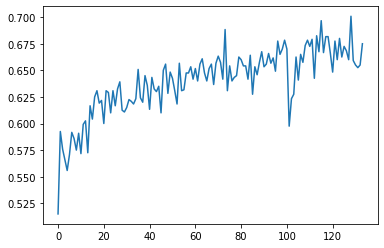

In [69]:
plt.plot(acc)

In [70]:
torch.save(model, "low_comp_polo_stn_lenet_LAMBDA_1em3.pt")

In [71]:
data, label = next(iter(dataloader['test']))

In [72]:
output = model.stn(data[0], data[1])

tensor([ 0.6284, -0.3753], grad_fn=<SelectBackward0>)


In [73]:
with torch.no_grad():
    cat, theta, z = model(data[0], data[1])
cat = torch.argmax(F.softmax(cat),1)

tensor([0.2905, 0.3231])


In [74]:
output[0].shape

torch.Size([50, 3, 28, 28])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


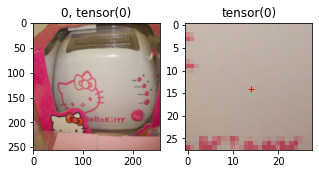

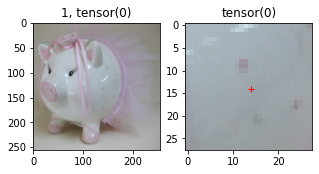

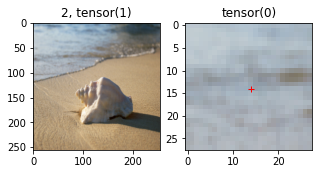

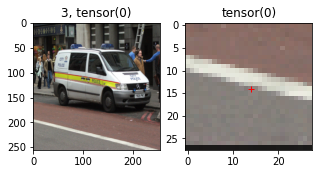

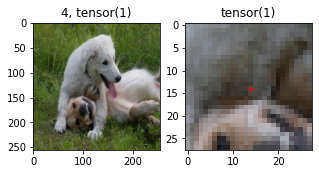

...

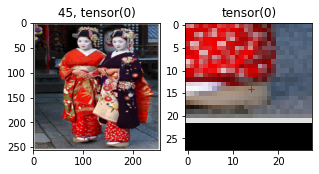

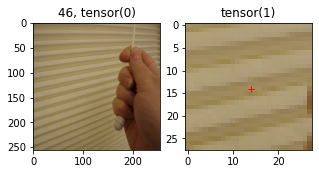

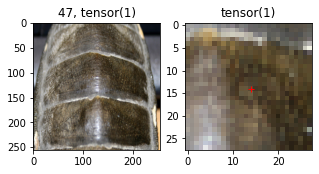

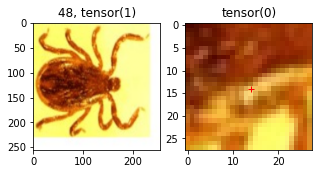

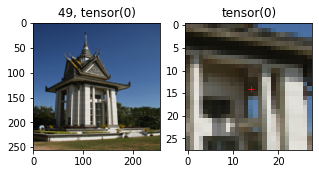

In [75]:
#theta = torch.cat((model.downscale.unsqueeze(0).repeat(
#            theta.size(0), 1, 1), theta.unsqueeze(2)),
#                          dim=2)
        
        #theta = theta.view(-1, 2, 3)
for num in range(50):
    plt.figure(figsize=(5,10))
    plt.subplot(1,2,1)
    img = data[0][num:num+1,...]   
    th = theta[num:num+1,...]
    #theta[0,:,2] = torch.FloatTensor((0,.5))
    #print(th)
    grid_size = torch.Size([1, 3, 28, 28])
    grid = F.affine_grid(th, grid_size)
    img_grid = F.grid_sample(img, grid)
    plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
    plt.title(str(num)+', '+str(label[num]))
    plt.subplot(1,2,2)
    plt.imshow(img_grid[0,:].permute(1,2,0).detach().numpy())
    plt.plot(14,14,'r+')
    plt.title(cat[num])

tensor([-0.2077,  0.4032])
tensor([ 0.5094, -0.0365])
tensor([ 0.0122, -0.2231])
tensor([ 0.0967, -0.6218])
tensor([ 0.1759, -0.2182])
tensor([0.6182, 0.0062])
tensor([-0.2137,  0.0776])
tensor([-0.0162, -0.0620])
tensor([-0.2226,  0.0389])
tensor([-0.0253, -0.1421])
tensor([0.5608, 0.0057])
tensor([ 0.0504, -0.3723])
tensor([0.1830, 0.1629])
tensor([0.0195, 0.1324])
tensor([-0.0938, -0.1404])
tensor([-0.1355,  0.2776])
tensor([-0.0521, -0.4471])
tensor([-0.3547, -0.3231])
tensor([-0.0790, -0.6236])
tensor([-0.0476,  0.1006])
tensor([-0.0256, -0.2790])


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


tensor([ 0.0357, -0.0689])
tensor([0.2477, 0.0585])
tensor([-0.0538,  0.1398])
tensor([-0.1718, -0.2282])
tensor([0.3610, 0.2826])
tensor([0.0340, 0.1417])
tensor([0.5171, 0.3835])
tensor([-0.3012, -0.1958])
tensor([0.2565, 0.2451])
tensor([-0.0224, -0.3828])
tensor([-0.0489,  0.0366])
tensor([-0.0295, -0.1492])
tensor([0.1400, 0.2825])
tensor([0.1825, 0.1801])
tensor([0.0300, 0.0826])
tensor([-0.1395, -0.0870])
tensor([0.0560, 0.0664])
tensor([0.3585, 0.3210])
tensor([ 0.3695, -0.2077])
tensor([-0.0170,  0.0104])
tensor([ 0.1381, -0.1119])
tensor([0.0327, 0.2149])
tensor([-0.0870, -0.2251])
tensor([ 0.0183, -0.0111])
tensor([-0.0938,  0.1873])
tensor([0.3046, 0.0769])
tensor([0.4961, 0.0762])
tensor([-0.1350,  0.3879])
tensor([ 0.0940, -0.2275])


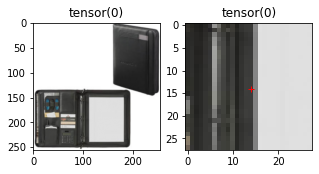

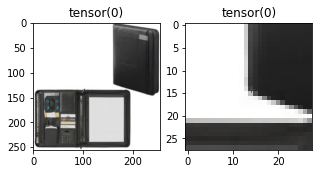

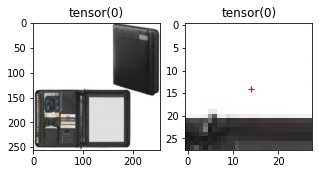

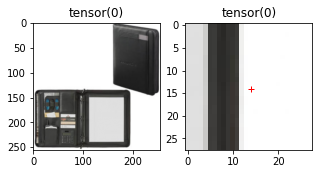

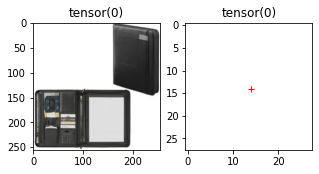

...

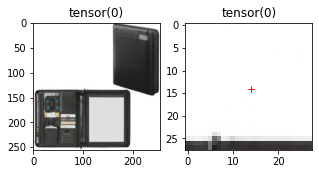

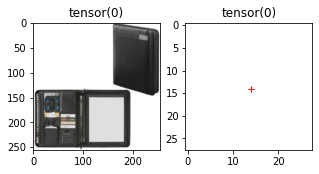

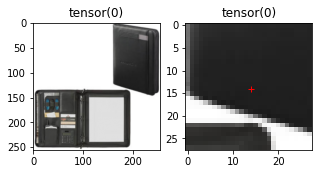

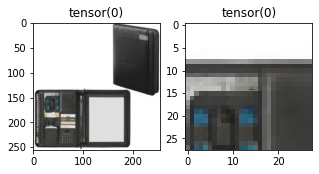

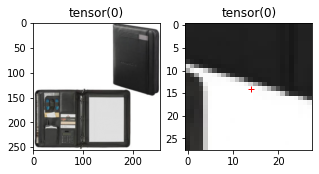

In [76]:
#theta = torch.cat((model.downscale.unsqueeze(0).repeat(
#            theta.size(0), 1, 1), theta.unsqueeze(2)),
#                          dim=2)
mem_z  = []
mem_cat  = []

        #theta = theta.view(-1, 2, 3)
for num in [43,]*50: #range(50):
    with torch.no_grad():
        #img = data[0][num,...].unsqueeze(0)
        #polo_img = {'in': data[1]['in'][num,...].unsqueeze(0),
        #             'out': data[1]['out'][num,...].unsqueeze(0)}
        cat, theta, z = model(data[0], data[1])
    cat = torch.argmax(F.softmax(cat),1)
    plt.figure(figsize=(5,10))
    plt.subplot(1,2,1)
    img = data[0][num:num+1,...]   
    th = theta[num:num+1,...]
    mem_z.append(z)
    mem_cat.append(cat)
    #theta[0,:,2] = torch.FloatTensor((0,.5))
    #print(th)
    grid_size = torch.Size([1, 3, 28, 28])
    grid = F.affine_grid(th, grid_size)
    img_grid = F.grid_sample(img, grid)
    plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
    plt.title(label[num])
    plt.subplot(1,2,2)
    plt.imshow(img_grid[0,:].permute(1,2,0).detach().numpy())
    plt.plot(14,14,'r+')
    plt.title(cat[num])


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


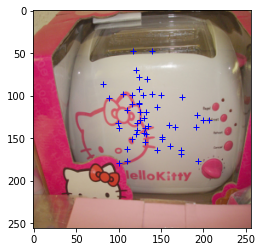

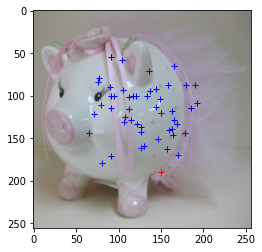

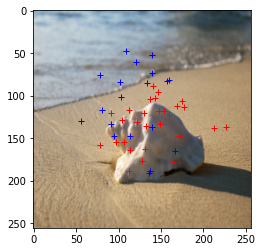

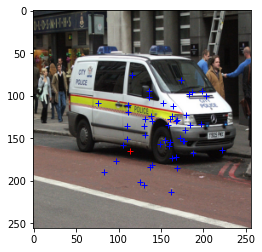

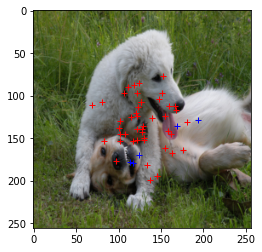

...

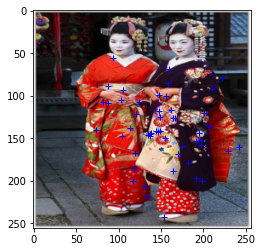

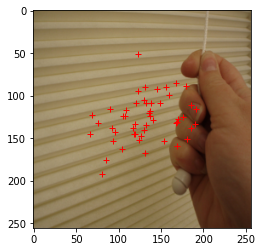

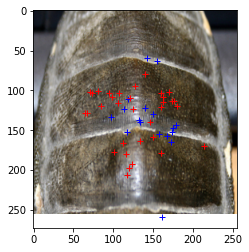

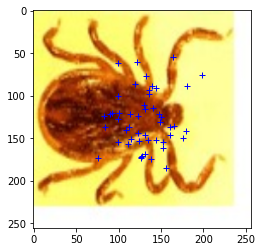

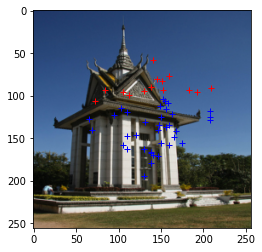

In [77]:
for num in range(batch_size):
    plt.figure()
    plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
    for i, z in enumerate(mem_z):
        if mem_cat[i][num] == 1:
            plt.plot(127.5 + z[num][0]*128, 127.5 + z[num][1]*128,'r+')
        else:
            plt.plot(127.5 + z[num][0]*128, 127.5 + z[num][1]*128,'b+')

In [ ]:
plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
for i, z in enumerate(mem_z):
    if mem_cat[i] == 1:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'r+')
    else:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'b+')

In [ ]:
plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
for i, z in enumerate(mem_z):
    if mem_cat[i] == 1:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'r+')
    else:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'b+')

In [ ]:
plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
for i, z in enumerate(mem_z):
    if mem_cat[i] == 1:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'r+')
    else:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'b+')

In [ ]:
plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
for i, z in enumerate(mem_z):
    if mem_cat[i] == 1:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'r+')
    else:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'b+')

In [ ]:
plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
for i, z in enumerate(mem_z):
    if mem_cat[i] == 1:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'r+')
    else:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'b+')

In [ ]:
cat[48]

In [ ]:
mem_z[18:19]

In [ ]:
len(mem_z)

In [ ]:
plt.imshow(data[0][1,:].permute(1,2,0).detach().numpy())

In [ ]:
plt.imshow(output[0][1,:].permute(1,2,0).detach().numpy())

In [ ]:
output[1][1][:,2].detach().numpy()